In [34]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('paper')

In [35]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error

In [36]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [37]:
sns.set_context('poster')
sns.set_style('white')

In [38]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['X', 'P', 's', 'D', 'o']
aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']
#  604 #FCC479
#     #ffd7a1
#     #fcb14c
#     MED4 = #62A586
#     9313 #F47681
#     natl #7A9BC8

In [39]:
method_cols = [
     'cubic', 'exponential', #'exponential_segmented',
       'gompertz', 'harmonic', 'linear', 'logistic3', 'logistic4',
       'loglogistic', 'rodbard4', 'scurve', 'hyperbolic']


In [40]:
method_cols = [
    'exponential', #'exponential_segmented',
]


In [41]:
df = pd.read_pickle('CCPA.pkl.gz')

In [42]:
df.loc[df.PRO == 'C9B', 'PRO'] = 'MIT0604'

In [43]:
dfc = df.loc[(df.experiment.isin(['e1','e3', 'e4','e5', 'e6'])) & (df.culture == 'Co_Culture')]

In [11]:
def convert_func(t0, x_col='day', value_col='FL', rolling_period='1d', resample_period='1d' ):
    # x_col='day'
    # rolling_period='3d'
    # resample_period='1d'
    # value_col='FL'
    t = t0
    maxday = t.loc[t[value_col] == t[value_col].max(), x_col].values[0]
    t.loc[:, x_col] = t.loc[:, x_col] - maxday

    t.index = pd.to_timedelta(t[x_col], unit='d')
    #t.sort_index(ascending=True, inplace=True)
    t1 = t.rolling(rolling_period, min_periods=1).agg({value_col : 'mean'})
    t2 = t1.resample(resample_period).agg({value_col : 'mean'})
    t2.index= t2.index.astype('timedelta64[D]')
    t3 = t2.interpolate(method='from_derivatives', limit_area='inside')
    return t3


In [12]:
groupby_cols = ['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture']
ds  = dfc.groupby(groupby_cols).apply(convert_func).reset_index() 

In [13]:
dfc_resample = ds.copy()

In [14]:
# ds.day = ds.day.astype('timedelta64[D]')
ds = ds.loc[(ds.day < 81) & (ds.day > -11)]

In [15]:
ds.head()

,experiment_sample,experiment,sample,PRO,ALT,culture,day,FL
5,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,-10,0.37325
6,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,-9,0.44400
7,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,-8,0.69700
8,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,-7,0.95000
9,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,-6,1.20300


# experiment 1

# experiment 1 PCA

In [44]:
df1 = dfc.loc[dfc.experiment == 'e1']

In [45]:
df1.head()

,day,experiment,sample,FL,PRO,ALT,culture,FL_orig,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0.133,-2.017406,0.133,-2.017406,-0.588889,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,0.159,-1.838851,0.292,-3.856257,-0.575917,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,0.155,-1.864330,0.447,-5.720587,-0.577913,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,0.180,-1.714798,0.627,-7.435386,-0.565440,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,0.632,-0.458866,1.259,-7.894252,-0.339936,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


In [18]:
df1 = dfc.loc[dfc.experiment == 'e1']
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(df1, value_col='FL', cumsummode=True)
metadf = cp.get_meta(df1)
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.89101301 0.06160666]


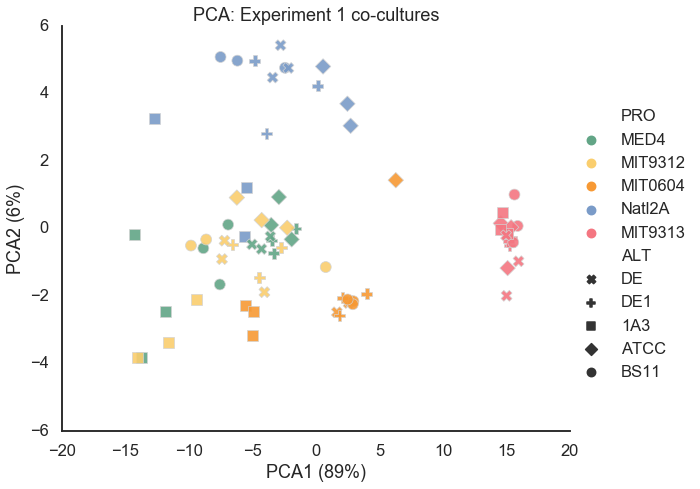

In [19]:
sns.set_context('talk')
ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            style_order=aorder, markers=amarkers,
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey', 
           )
plt.xlabel('PCA1 (89%)')
plt.ylabel('PCA2 (6%)')
plt.title('PCA: Experiment 1 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

In [24]:
df3 = dfc.loc[dfc.experiment == 'e3']
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(df3, value_col='FL', cumsummode=True)
metadf = cp.get_meta(df3)
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.86215634 0.06888719]


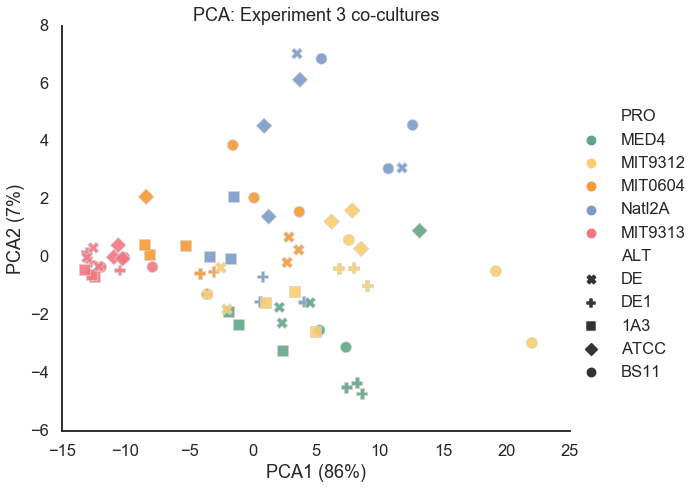

In [25]:
sns.set_context('talk')
ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            style_order=aorder, markers=amarkers,
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey', 
           )
plt.xlabel('PCA1 (86%)')
plt.ylabel('PCA2 (7%)')
plt.title('PCA: Experiment 3 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

In [28]:
df4 = dfc.loc[dfc.experiment == 'e4']
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(df4, value_col='FL', cumsummode=True)
metadf = cp.get_meta(df4)
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.86012171 0.06528891]


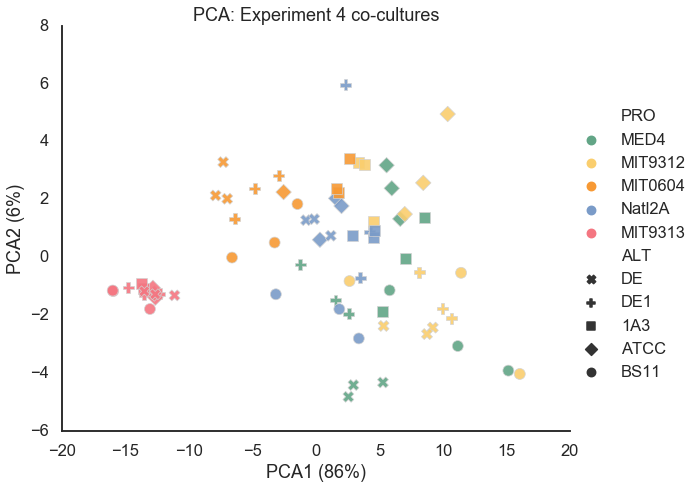

In [29]:
sns.set_context('talk')
ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            style_order=aorder, markers=amarkers,
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey', 
           )
plt.xlabel('PCA1 (86%)')
plt.ylabel('PCA2 (6%)')
plt.title('PCA: Experiment 4 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

In [30]:
df5 = dfc.loc[dfc.experiment == 'e5']
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(df5, value_col='FL', cumsummode=True)
metadf = cp.get_meta(df5)
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.66411219 0.20167834]


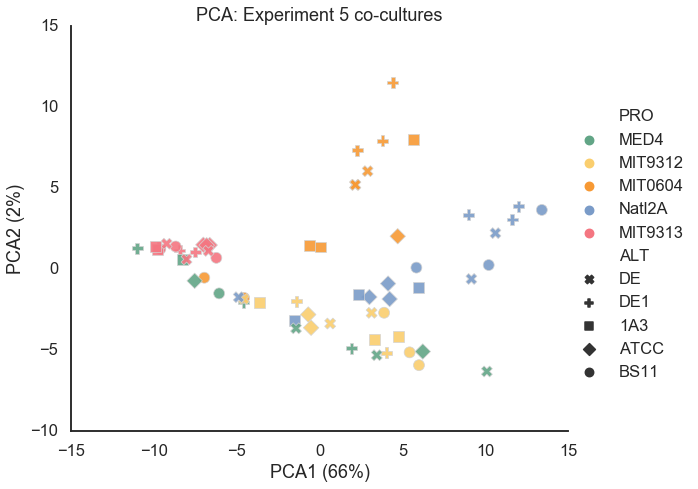

In [31]:
sns.set_context('talk')
ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            style_order=aorder, markers=amarkers,
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey', 
           )
plt.xlabel('PCA1 (66%)')
plt.ylabel('PCA2 (2%)')
plt.title('PCA: Experiment 5 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

In [32]:
df6 = dfc.loc[dfc.experiment == 'e6']
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(df6, value_col='FL', cumsummode=True)
metadf = cp.get_meta(df6)
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.60705338 0.19295257]


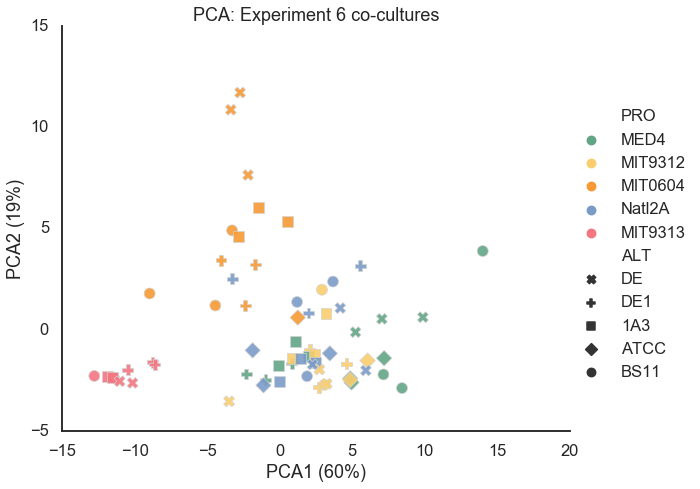

In [33]:
sns.set_context('talk')
ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            style_order=aorder, markers=amarkers,
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey', 
           )
plt.xlabel('PCA1 (60%)')
plt.ylabel('PCA2 (19%)')
plt.title('PCA: Experiment 6 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

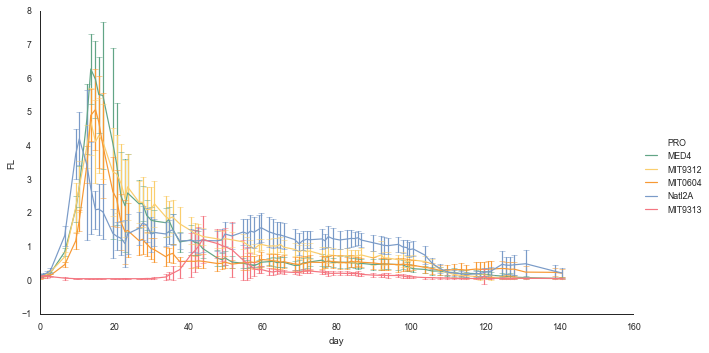

In [142]:
sns.set_context('paper')
g = sns.relplot(data=df1, #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, err_style='bars',
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
#g.set(yscale='log')
#for lh in ax._legend.legendHandles: 
#    lh.linewidth([70])

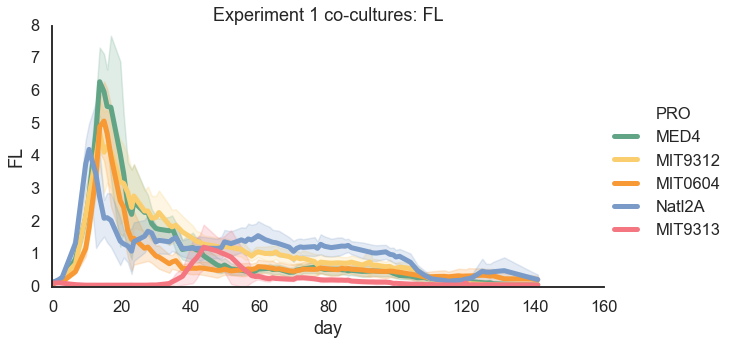

In [40]:
sns.set_context('talk')
g = sns.relplot(data=df1, #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
#g.set(yscale='log')
plt.title('Experiment 1 co-cultures: FL')
plt.ylim((0,8))
#leg = g.ax.legend()
leg = g._legend

for lh in leg.get_lines(): 
    lh.set_linewidth(5)

In [20]:
df.culture.unique()

array(['Co_Culture', 'Axenic', 'All_Pro', 'All_strains'], dtype=object)

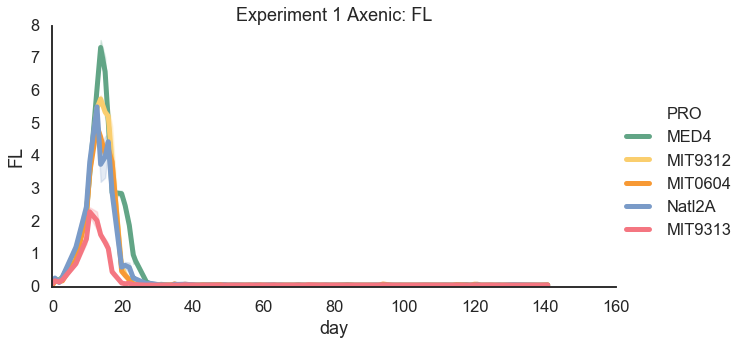

In [39]:
sns.set_context('talk')
g = sns.relplot(data=df.loc[(df.experiment == 'e1') & (df.culture == 'Axenic')], #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
#g.set(yscale='log')
plt.title('Experiment 1 Axenic: FL')
plt.ylim((0,8))
leg = g._legend
# g.ax.legend(frameon=False)

for lh in leg.legendHandles: 
    #print(lh)
    lh.set_linewidth(5)
#plt.show()

In [ ]:
g.ax.legend

Text(0.5, 1.0, 'Experiment 1: FL (log scale)')

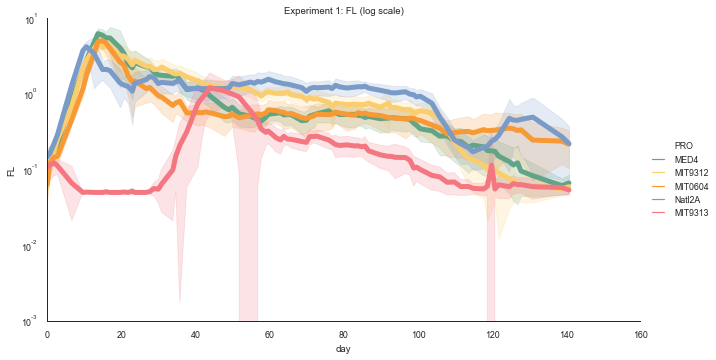

In [144]:
sns.set_context('paper')
g = sns.relplot(data=df1, #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
                linewidth=5,
            hue_order=porder, palette=ppallete)
g.set(yscale='log')
plt.title('Experiment 1: FL (log scale)')

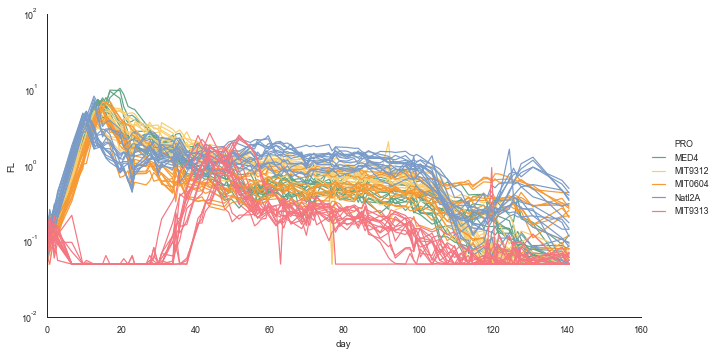

In [145]:
sns.set_context('paper')
g = sns.relplot(data=df1, #row='experiment_list', #row='experiment',
            estimator=None, units='experiment_sample', #row='ALT',
            #row_order=aorder, col_order=porder,
            #ci='sd', 
            aspect=1.8, #err_style='bars',
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
g.set(yscale='log')

In [146]:
df_features_1 = cp.generate_features(df1)


In [147]:
df_features_1.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'auc', 'experiment',
       'sample', 'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decline_half_day',
       'decline_half_val', 'decline_log_half_day', 'decline_log_half_val',
       'decline_tenth_day', 'decline_tenth_val', 'decline_log_tenth_day',
       'decline_log_tenth_val', 'decline_

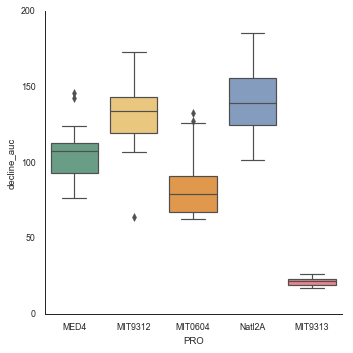

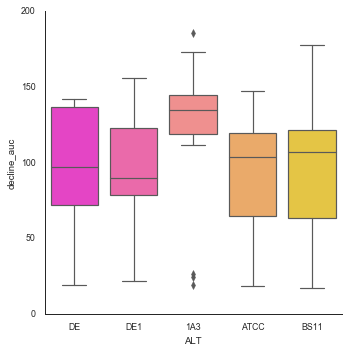

In [148]:
sns.catplot(data=df_features_1, x='PRO', y='decline_auc', order=porder, palette=ppallete, kind='box')
sns.catplot(data=df_features_1, x='ALT', y='decline_auc', order=aorder, palette=apallete, kind='box')
#sns.catplot(data=df_features_1, x='PRO', y='auc', order=porder, palette=ppallete, kind='box')
#sns.catplot(data=df_features_1, x='PRO', y='max_day', order=porder, palette=ppallete, kind='box')


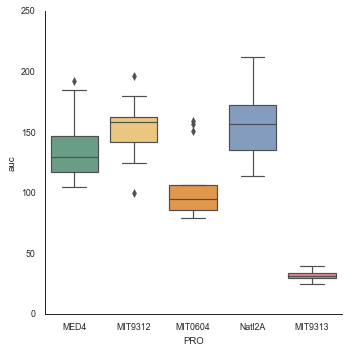

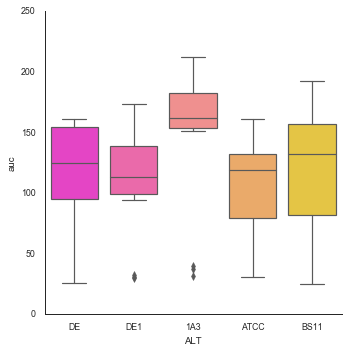

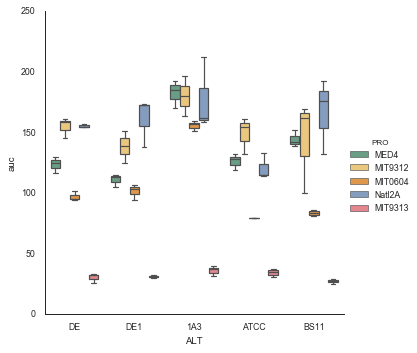

In [149]:
sns.catplot(data=df_features_1, x='PRO', y='auc', order=porder, palette=ppallete, kind='box')
sns.catplot(data=df_features_1, x='ALT', y='auc', order=aorder, palette=apallete, kind='box')
sns.catplot(data=df_features_1, x='ALT', y='auc', order=aorder, palette=ppallete, hue='PRO', hue_order=porder, kind='box')
#sns.catplot(data=df_features_1, x='PRO', y='auc', order=porder, palette=ppallete, kind='box')
#sns.catplot(data=df_features_1, x='PRO', y='max_day', order=porder, palette=ppallete, kind='box')


In [150]:
from scipy.stats import f_oneway

In [151]:
df_features_1.head()

,max,max_log,max_day,min,min_log,auc,experiment,sample,PRO,ALT,...,decline_min_log,decline_max_log,decline_mean_rate,decline_std_rate,decline_min_rate,decline_max_rate,decline_mean_log_rate,decline_std_log_rate,decline_min_log_rate,decline_max_log_rate
experiment_sample,,,,,,,,,,,,,,,,,,,,,
"e1, 10A",5.621,1.726510,14.960417,0.060,-2.813411,95.267299,e1,10A,MIT0604,DE,...,-1.795767,1.726510,-0.055531,0.288990,-1.764728,0.548631,-0.021946,0.188968,-0.649153,0.877455
"e1, 10B",5.660,1.733424,14.960417,0.051,-2.975930,101.857979,e1,10B,MIT0604,DE,...,-1.795767,1.733424,-0.052659,0.277603,-1.587807,0.721883,-0.015819,0.191918,-0.703601,1.047777
"e1, 10C",5.704,1.741168,14.960417,0.066,-2.718101,93.966445,e1,10C,MIT0604,DE,...,-2.198225,1.741168,-0.058991,0.263949,-1.686345,0.381420,-0.029407,0.205084,-0.896328,0.744343
"e1, 11A",7.199,1.973942,13.694444,0.050,-2.995732,113.009390,e1,11A,MED4,DE1,...,-2.995732,1.973942,-0.036740,0.386392,-2.042426,2.316647,-0.028368,0.186866,-0.539666,0.460682
"e1, 11B",7.116,1.962346,14.960417,0.050,-2.995732,104.976911,e1,11B,MED4,DE1,...,-2.995732,1.962346,-0.052119,0.273838,-1.697543,0.792276,-0.036230,0.190024,-0.717497,0.583652


In [152]:
lst = [df_features_1.loc[df_features_1.PRO==p, 'max'].tolist()
       for p in df_features_1.PRO.unique()]
#lst   
f_oneway(*lst)[0]

41.77604659654645

In [153]:
df_features_1.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'auc', 'experiment',
       'sample', 'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decline_half_day',
       'decline_half_val', 'decline_log_half_day', 'decline_log_half_val',
       'decline_tenth_day', 'decline_tenth_val', 'decline_log_tenth_day',
       'decline_log_tenth_val', 'decline_

In [154]:
def run_anova(f):
    lst = [df_features_1.loc[df_features_1.PRO==p, f].tolist()
       for p in df_features_1.PRO.unique()]
    anova = f_oneway(*lst)
    return f, anova[0], anova[1]

In [155]:
lst = [run_anova(i) for i in df_features_1.columns if i not in ['experiment', 'sample', 'PRO', 'ALT', 'culture'] ]

In [156]:
anova_df1 = pd.DataFrame(data=lst, columns=['featue', 'anova', 'pvalue'])

In [157]:
anova_df1.loc[anova_df1.pvalue <0.05].nlargest(10, 'anova')

,featue,anova,pvalue
18,growth_logauc,1611.896711,1.480899e-66
16,growth_log_score_r2,982.053560,2.432620e-59
6,growth_half_day,633.240371,5.292312e-53
2,max_day,551.709497,5.014841e-51
25,growth_mean_log,260.367780,1.944320e-40
15,growth_log_coefficient,229.219371,1.107196e-38
56,decline_mean_log,112.830490,2.920377e-29
8,growth_log_half_day,110.538968,5.336414e-29
14,growth_log_intercept,106.559479,1.560401e-28
29,growth_mean_rate,83.589054,1.639539e-25


In [158]:
col = 'PRO'
#lut = dict(zip(df_features_1[col].unique(), sns.color_palette('Set2', n_colors=df_features_1[col].nunique())))
lut = dict(zip(porder, sns.color_palette(ppallete, n_colors=df_features_1[col].nunique())))
row_colors = df_features_1[col].map(lut)

col2 = 'experiment'
#lut2 = dict(zip(df_features_1[col2].unique(), sns.color_palette('Set3', n_colors=df_features_1[col2].nunique())))
lut2 = dict(zip(eorder, sns.color_palette(epallete, n_colors=df_features_1[col2].nunique())))
row_colors2 = df_features_1[col2].map(lut2)

col3 = 'ALT'
lut3 = dict(zip(aorder, sns.color_palette(apallete, n_colors=df_features_1[col3].nunique())))
row_colors3 = df_features_1[col3].map(lut3)


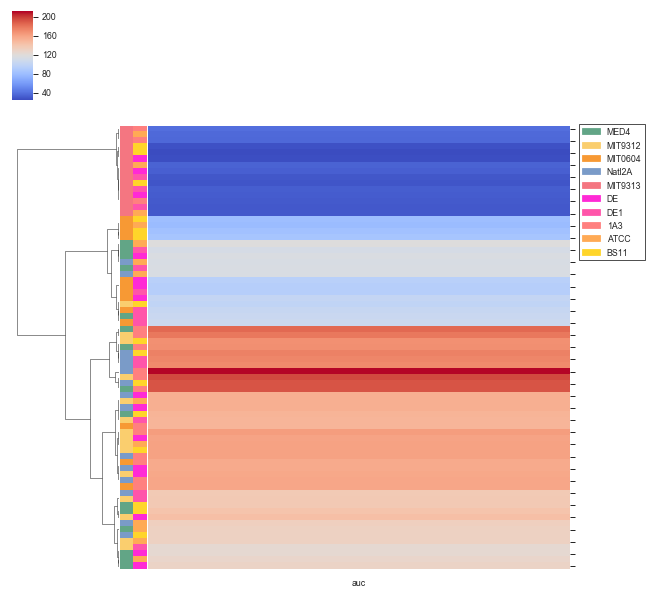

In [159]:
import matplotlib.patches as mpatches
g = sns.clustermap(data=df_features_1['auc'], col_cluster=False, #row_cluster=False,
                   cmap="coolwarm", 
                   row_colors=[row_colors, 
                       row_colors3
                              ], 
               method='ward'
                  )
g.ax_heatmap.set_yticklabels('')
g.ax_heatmap.set_ylabel('')
legend_TN =  [mpatches.Patch(color=c, label=l) for l,c in lut.items()]
legend_TN.extend([mpatches.Patch(color=c, label=l) for l,c in lut3.items()])

l2=g.ax_heatmap.legend(loc='center left',bbox_to_anchor=(1.01,0.85),handles=legend_TN,frameon=True)

Text(0.5, 1.0, 'mean auc')

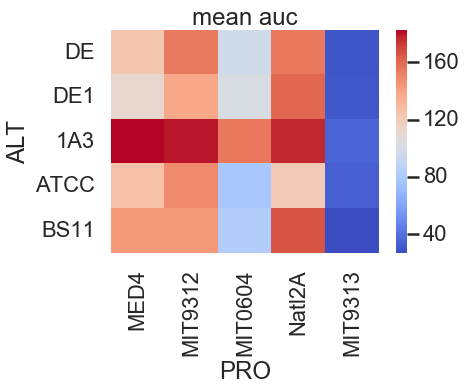

In [160]:
sns.set_context('poster')
t = df_features_1.pivot_table(index='ALT', columns=['PRO'], 
                                              values=['auc'], aggfunc='mean')
t.columns = t.columns.get_level_values(1)
t = t[porder]
t =t.reindex(aorder)
sns.heatmap(t, #annot=True, 
            cmap='coolwarm')
plt.title('mean auc')

Text(0.5, 1.0, 'mean decline auc')

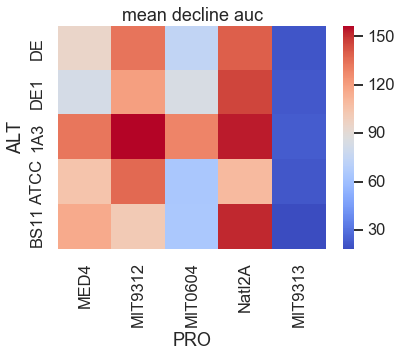

In [162]:
sns.set_context('talk')
t = df_features_1.pivot_table(index='ALT', columns=['PRO'], 
                                              values=['decline_auc'], aggfunc='mean')
t.columns = t.columns.get_level_values(1)
t = t[porder]
t =t.reindex(aorder)
sns.heatmap(t, #annot=True, 
            cmap='coolwarm')
plt.title('mean decline auc')

# compare experiments

In [106]:
dfc.head()

,day,experiment,sample,FL,PRO,ALT,culture,FL_orig,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0.133,-2.017406,0.133,-2.017406,-0.588889,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,0.159,-1.838851,0.292,-3.856257,-0.575917,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,0.155,-1.864330,0.447,-5.720587,-0.577913,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,0.180,-1.714798,0.627,-7.435386,-0.565440,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,0.632,-0.458866,1.259,-7.894252,-0.339936,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


Text(0.5, 1.0, 'MIT9313 & 1A3 - compare experiments')

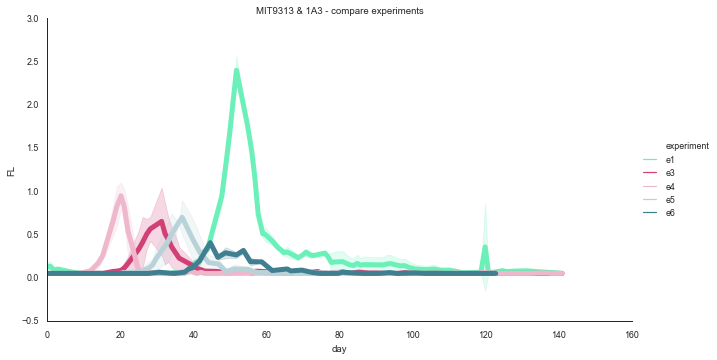

In [41]:
sns.set_context('paper')
g = sns.relplot(data=dfc.loc[(dfc.PRO=='MIT9313') & (dfc.ALT == '1A3')]
                , #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='experiment', #legend=False, 
            hue_order=eorder, palette=epallete)
#g.set(yscale='log')
plt.title('MIT9313 & 1A3 - compare experiments')

Text(0.5, 1.0, '1A3 co-cultures - compare experiments')

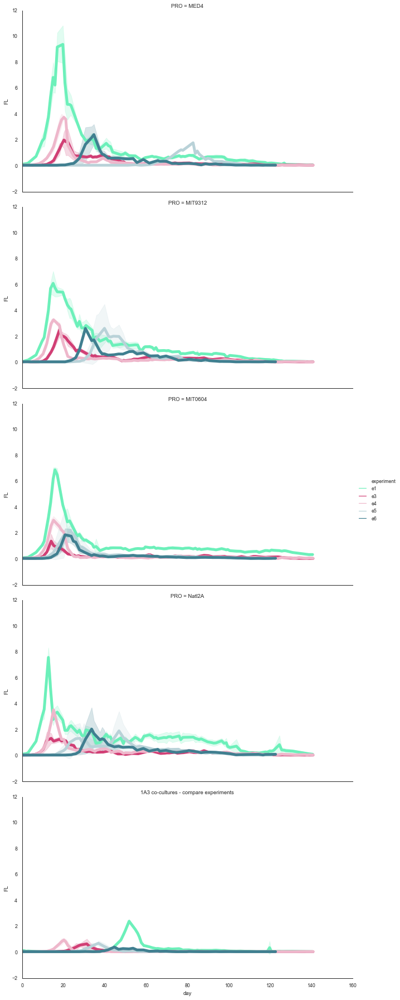

In [24]:
sns.set_context('paper')
g = sns.relplot(data=dfc.loc[(dfc.ALT == '1A3')]
                , #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='experiment', #legend=False, 
            hue_order=eorder, palette=epallete,
               row='PRO',
                row_order=porder,
               )
#g.set(yscale='log')
plt.title('1A3 co-cultures - compare experiments')

In [25]:
sample_col = 'experiment_sample'
X = cp.experiments2X(dfc.loc[dfc.experiment.isin(['e3','e4'])], value_col='FL', cumsummode=True)
metadf = cp.get_meta(dfc.loc[dfc.experiment.isin(['e3','e4'])])
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.86045175 0.06818737]


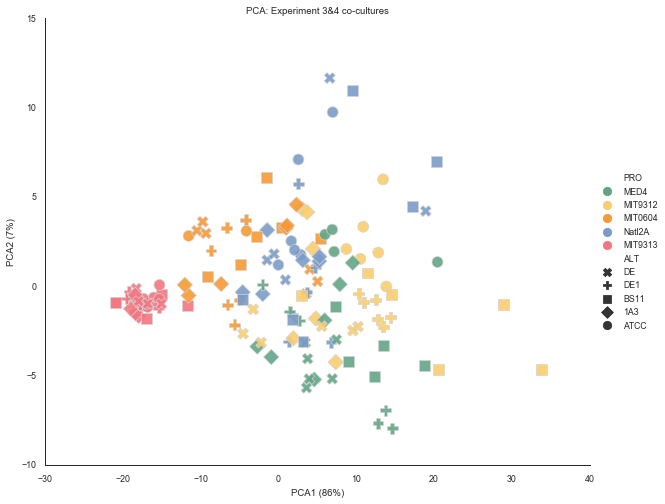

In [27]:

ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='culture', 
            style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2, markers=amarkers,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )
plt.xlabel('PCA1 (86%)')
plt.ylabel('PCA2 (7%)')
plt.title('PCA: Experiment 3&4 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

In [29]:
sample_col = 'experiment_sample'
X = cp.experiments2X(dfc.loc[dfc.experiment.isin(['e3','e4', 'e5','e6', ])], value_col='FL', cumsummode=True)
metadf = cp.get_meta(dfc.loc[dfc.experiment.isin(['e3','e4', 'e5','e6', ])])
#metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.73252869 0.16013945]


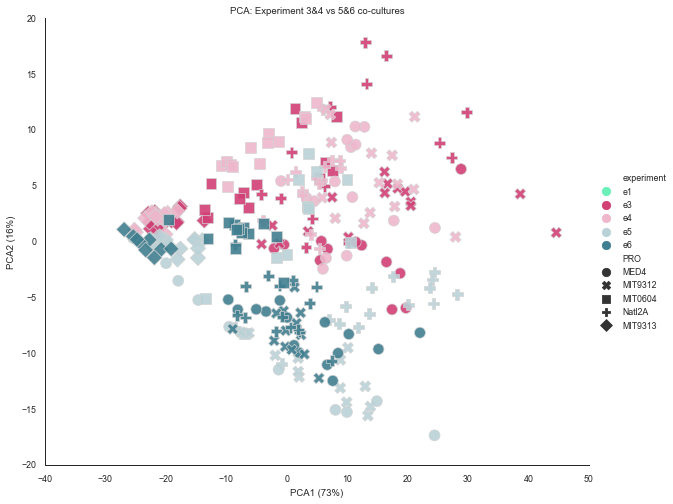

In [30]:

ax = sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', 
            #style='culture', 
            style='PRO', style_order=porder,
            s=120, alpha=0.9, height=7, aspect=1.2, 
            palette=epallete, hue_order=eorder ,edgecolor='lightgrey',
           )
plt.xlabel('PCA1 (73%)')
plt.ylabel('PCA2 (16%)')
plt.title('PCA: Experiment 3&4 vs 5&6 co-cultures')
for lh in ax._legend.legendHandles: 
    lh.set_sizes([70])

Text(0.5, 1.0, 'Experiment 3: FL (log)')

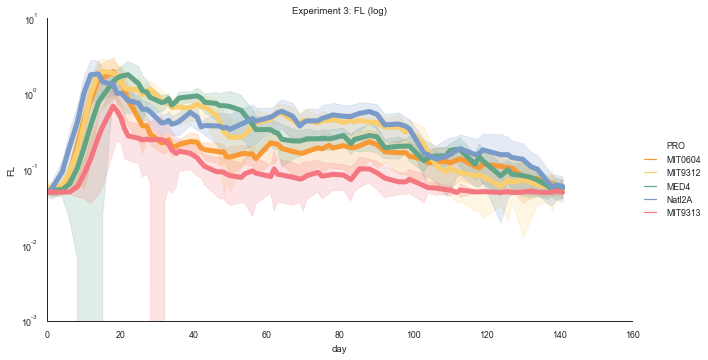

In [46]:
sns.set_context('paper')
g = sns.relplot(data=dfc.loc[dfc.experiment.isin(['e3'])],
                #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
g.set(yscale='log')
plt.title('Experiment 3: FL (log)')


Text(0.5, 1.0, 'Experiment 3: FL (log)')

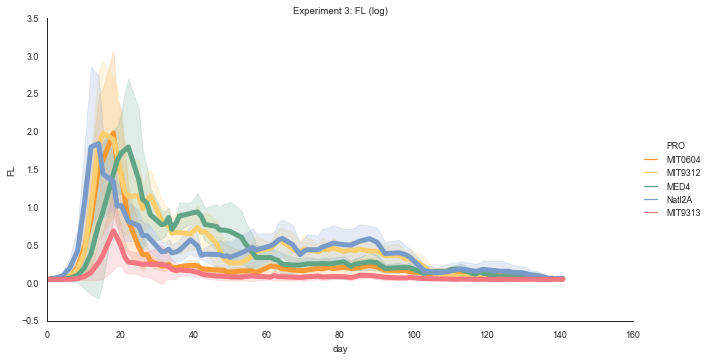

In [47]:
sns.set_context('paper')
g = sns.relplot(data=dfc.loc[dfc.experiment.isin(['e3'])],
                #row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8, #err_style='bars',
            linewidth=5,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
#g.set(yscale='log')
plt.title('Experiment 3: FL (log)')

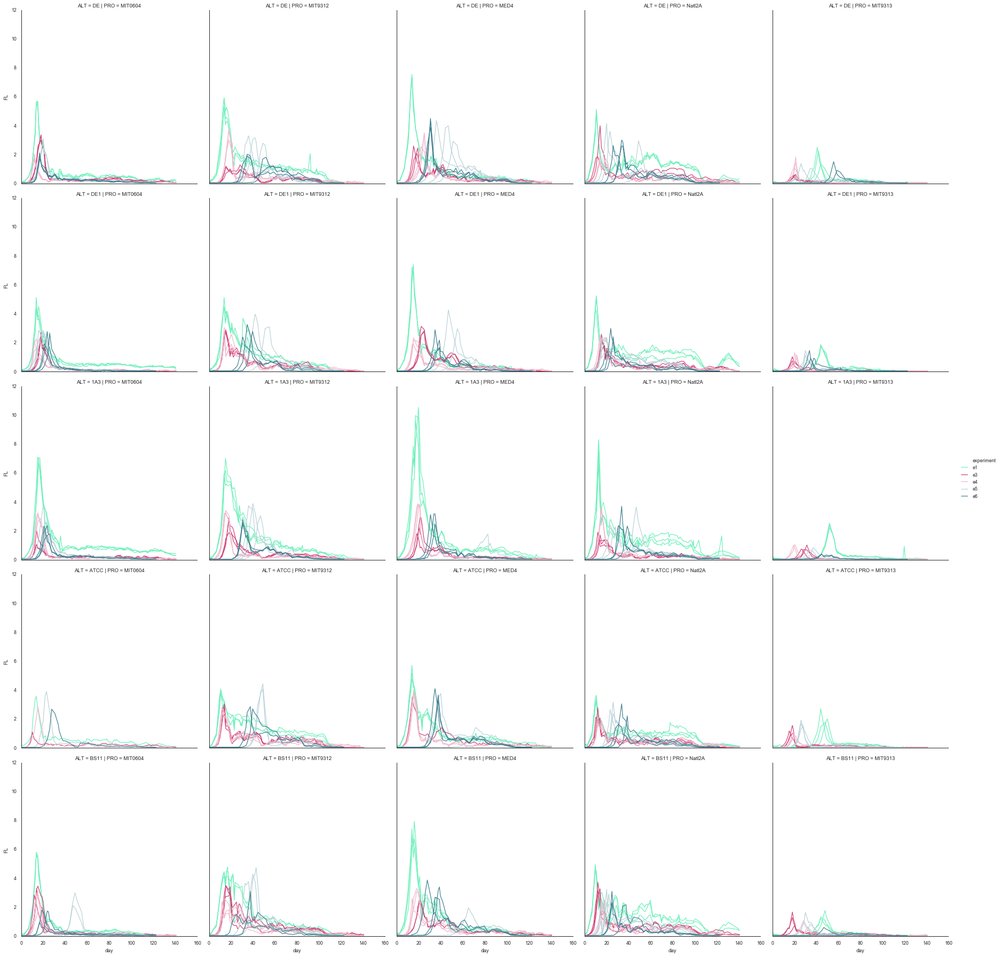

In [48]:
sns.relplot(data=dfc, col='PRO', #row='experiment',
            estimator=None, units='experiment_sample', row='ALT', row_order=aorder, col_order=porder,
            x='day', y='FL', kind='line', hue='experiment', #legend=False, 
            hue_order=eorder, palette=epallete)

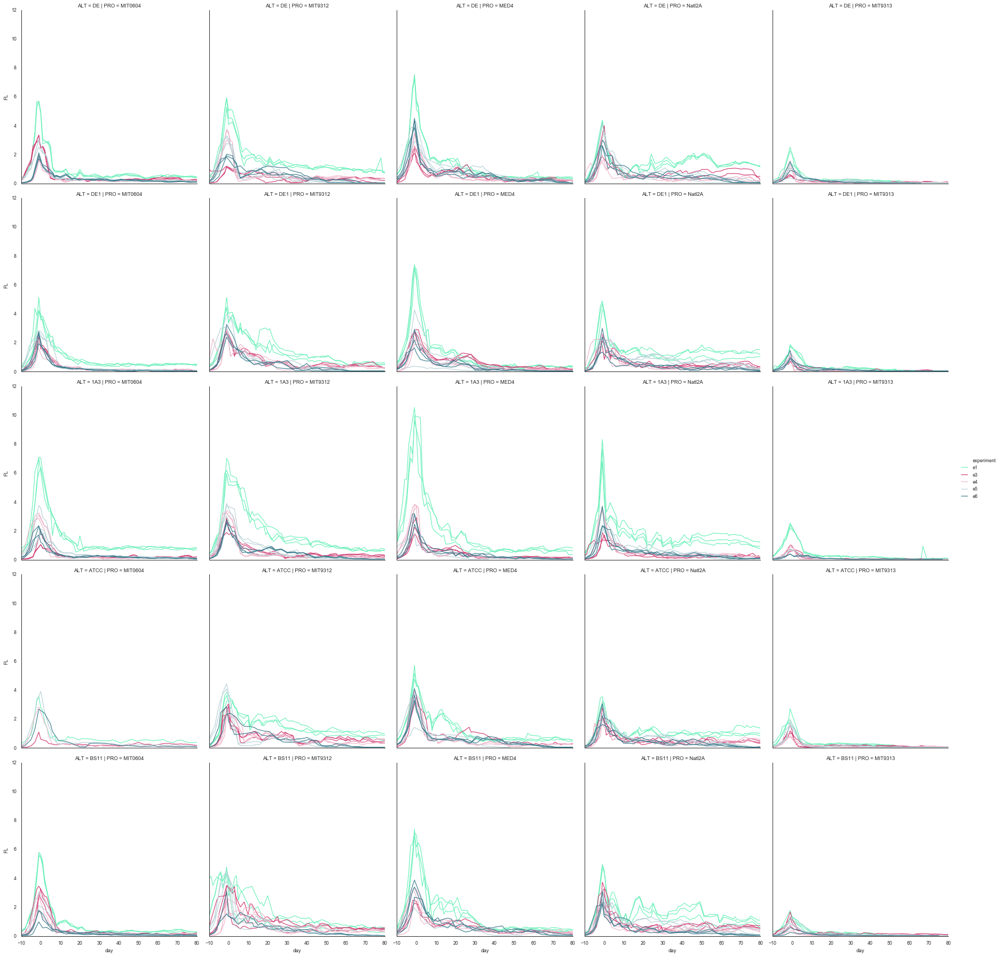

In [49]:
sns.relplot(data=ds, col='PRO', #row='experiment',
            estimator=None, units='experiment_sample', row='ALT',
            row_order=aorder, col_order=porder,
            x='day', y='FL', kind='line', hue='experiment', #legend=False, 
            hue_order=eorder, palette=epallete)

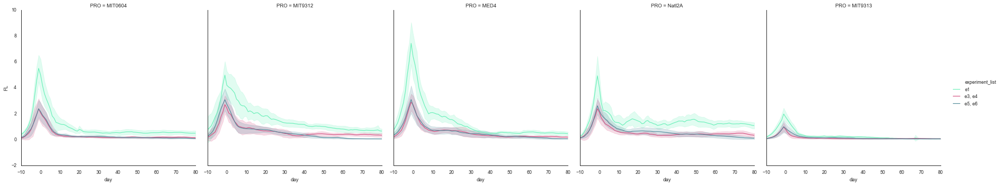

In [50]:
ds['experiment_list'] = ''
ds.loc[ds.experiment.isin(['e3','e4']), 'experiment_list'] = 'e3, e4'
ds.loc[ds.experiment.isin(['e5','e6']), 'experiment_list'] = 'e5, e6'
ds.loc[ds.experiment.isin(['e1']), 'experiment_list'] = 'e1'


g = sns.relplot(data=ds, hue='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', #aspect=1.8,
            x='day', y='FL', kind='line', col='PRO', #legend=False, 
            #hue_order=porder, 
                palette=espallete,
                col_order=porder,
               )
#g.set(yscale='log')

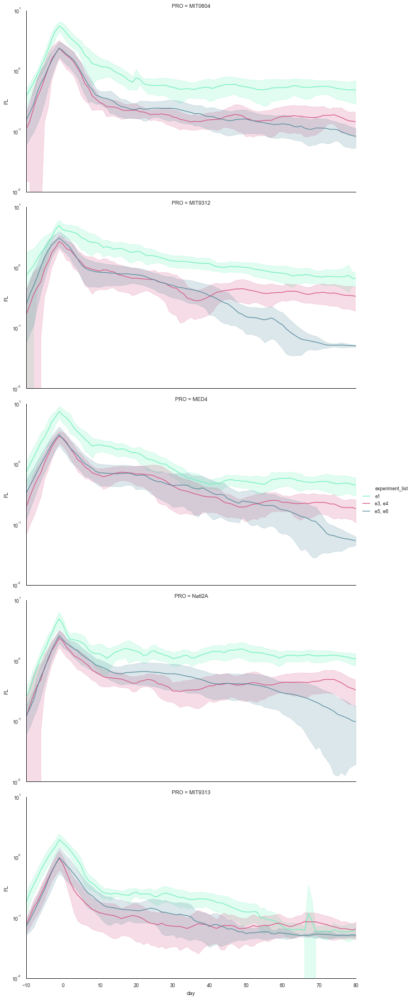

In [51]:
#ds['experiment_list'] = ''
#ds.loc[ds.experiment.isin(['e3','e4']), 'experiment_list'] = 'e3, e4'
#ds.loc[ds.experiment.isin(['e5','e6']), 'experiment_list'] = 'e5, e6'


g = sns.relplot(data=ds, hue='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8,
            x='day', y='FL', kind='line', row='PRO', #legend=False, 
            #hue_order=porder, 
                palette=espallete,
                row_order=porder
               )
g.set(yscale='log')

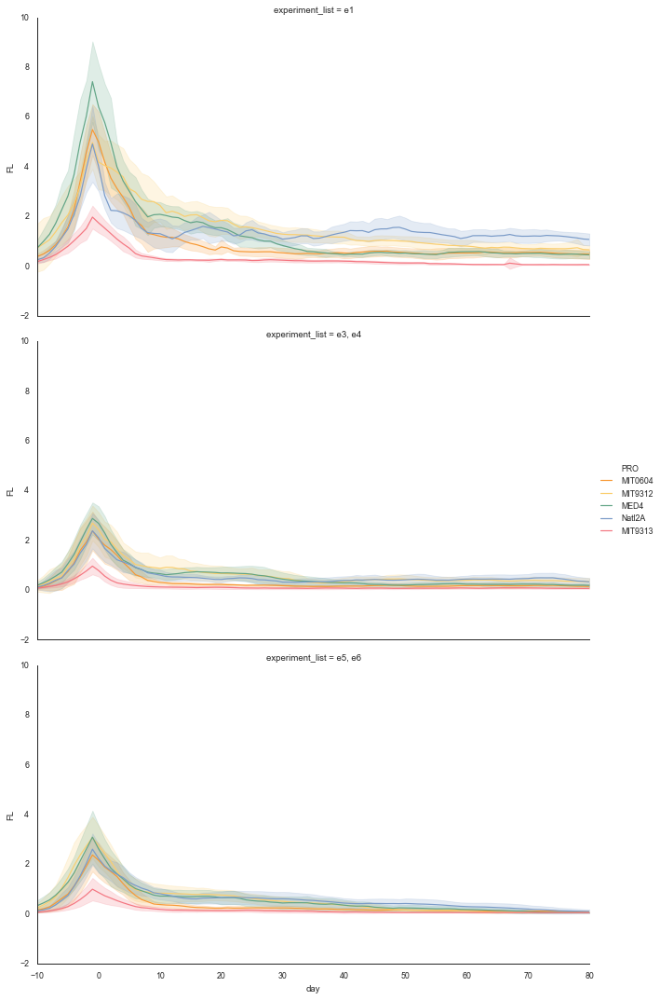

In [52]:
g = sns.relplot(data=ds, row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
#g.set(yscale='log')

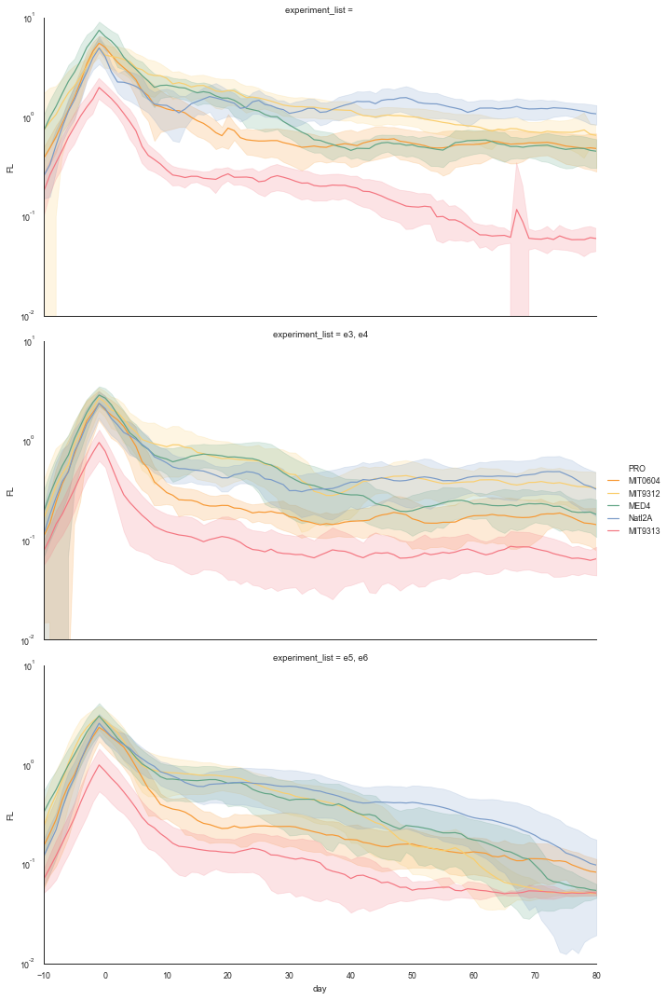

In [53]:
ds['experiment_list'] = ''
ds.loc[ds.experiment.isin(['e3','e4']), 'experiment_list'] = 'e3, e4'
ds.loc[ds.experiment.isin(['e5','e6']), 'experiment_list'] = 'e5, e6'


g = sns.relplot(data=ds, row='experiment_list', #row='experiment',
            #estimator=None, units='experiment_sample', row='ALT',
            #row_order=aorder, col_order=porder,
            ci='sd', aspect=1.8,
            x='day', y='FL', kind='line', hue='PRO', #legend=False, 
            hue_order=porder, palette=ppallete)
g.set(yscale='log')

In [54]:
ds['decline'] = ds['FL']

In [55]:
ds1 = ds.loc[ds.experiment.isin(['e1'])]
ds34 = ds.loc[ds.experiment.isin(['e3', 'e4'])]
ds56 = ds.loc[ds.experiment.isin(['e5', 'e6'])]

In [56]:
ds1 = ds1.loc[ds1['sample'] != '25C']
ds34 = ds34.loc[ds34['sample'] != '25C']
ds56 = ds56.loc[ds56['sample'] != '25C']


In [57]:
ds34.head()

,experiment_sample,experiment,sample,PRO,ALT,culture,day,FL,experiment_list,decline
10344,"e3, 10A",e3,10A,MIT0604,DE,Co_Culture,-10,0.299,"e3, e4",0.299
10345,"e3, 10A",e3,10A,MIT0604,DE,Co_Culture,-9,0.381,"e3, e4",0.381
10346,"e3, 10A",e3,10A,MIT0604,DE,Co_Culture,-8,0.693,"e3, e4",0.693
10347,"e3, 10A",e3,10A,MIT0604,DE,Co_Culture,-7,0.959,"e3, e4",0.959
10348,"e3, 10A",e3,10A,MIT0604,DE,Co_Culture,-6,1.225,"e3, e4",1.225


In [58]:
train1_df_orig, test1_df_orig = cp.split_train_test(ds1,test_size=0.4)
train34_df_orig, test34_df_orig = cp.split_train_test(ds34,test_size=0.4)
train56_df_orig, test56_df_orig = cp.split_train_test(ds56,test_size=0.4)

In [59]:
test1_df_orig.groupby(['PRO', 'ALT'])['sample'].unique()

PRO      ALT 
MED4     1A3           [1B]
         ATCC         [21B]
         BS11         [16A]
         DE        [6A, 6B]
         DE1          [11A]
MIT0604  1A3       [5B, 5C]
         BS11         [20C]
         DE           [10A]
         DE1          [15B]
MIT9312  1A3           [3A]
         ATCC         [23C]
         BS11    [18A, 18C]
         DE            [8B]
         DE1          [13C]
MIT9313  1A3           [2B]
         ATCC         [22B]
         BS11         [17A]
         DE            [7A]
         DE1     [12A, 12B]
Natl2A   1A3           [4B]
         ATCC         [24A]
         BS11    [19B, 19C]
         DE            [9A]
         DE1          [14B]
Name: sample, dtype: object

In [60]:
train1_df = cp.augment_training(train1_df_orig, noise_N=3, augment_x=False)
test1_df = test1_df_orig
train34_df = cp.augment_training(train34_df_orig, noise_N=3, augment_x=False)
test34_df = test34_df_orig
train56_df = cp.augment_training(train56_df_orig, noise_N=3, augment_x=False)
test56_df = test56_df_orig

In [61]:
train1_df.shape, test1_df.shape, train34_df.shape, test34_df.shape, train56_df.shape, test56_df.shape, 

((328692, 10), (2639, 10), (634452, 10), (5096, 10), (561708, 10), (4542, 10))

In [62]:
train34_df.columns

Index(['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture',
       'day', 'FL', 'augment_name', 'experiment_sample_orig'],
      dtype='object')

In [63]:
stats34_list = []
y34_list = []
clf34_list = []
features34_list = []
res, _y_list, _clf_list, _features_list = cp.compare_models2(train34_df, test34_df, 
               value_col_list=['FL'], 
               y_col_list=['PRO'], 
               repetitions=30,
               return_y=True)
stats34_list.extend(res)
y34_list.extend(_y_list)
clf34_list.extend(_clf_list)
features34_list.extend(_features_list)

PRO_FL
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0


In [64]:
stats56_list = []
y56_list = []
clf56_list = []
features56_list = []
res, _y_list, _clf_list, _features_list = cp.compare_models2(train56_df, test56_df, 
               value_col_list=['FL'], 
               y_col_list=['PRO'], 
               repetitions=30,
               return_y=True)
stats56_list.extend(res)
y56_list.extend(_y_list)
clf56_list.extend(_clf_list)
features56_list.extend(_features_list)

PRO_FL
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0


In [65]:
stats1_list = []
y1_list = []
clf1_list = []
features1_list = []
res, _y_list, _clf_list, _features_list = cp.compare_models2(train1_df, test1_df, 
               value_col_list=['FL'], 
               y_col_list=['PRO'], 
               repetitions=30,
               return_y=True)
stats1_list.extend(res)
y1_list.extend(_y_list)
clf1_list.extend(_clf_list)
features1_list.extend(_features_list)

PRO_FL
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0
train score 1.0
oob score 1.0


In [40]:
stats56_df = pd.DataFrame.from_records(stats56_list)
stats34_df = pd.DataFrame.from_records(stats34_list)
stats1_df = pd.DataFrame.from_records(stats1_list)


In [41]:
stats56_df.sort_values('f1_test', ascending=False).loc[:,['f1_test','accuracy_test', 'accuracy_train',  
       ]].head(10)

,f1_test,accuracy_test,accuracy_train
22,0.781620,0.784314,1.0
0,0.781470,0.784314,1.0
8,0.781281,0.784314,1.0
27,0.780841,0.784314,1.0
6,0.764995,0.764706,1.0
4,0.762792,0.764706,1.0
18,0.762526,0.764706,1.0
13,0.762526,0.764706,1.0
23,0.762526,0.764706,1.0
11,0.762186,0.764706,1.0


In [42]:
stats34_df.sort_values('f1_test', ascending=False).loc[:,['f1_test','accuracy_test', 'accuracy_train',  
       ]].head(10)

,f1_test,accuracy_test,accuracy_train
17,0.926354,0.928571,1.0
15,0.908807,0.910714,1.0
3,0.908807,0.910714,1.0
14,0.908807,0.910714,1.0
6,0.892532,0.892857,1.0
21,0.892007,0.892857,1.0
10,0.891726,0.892857,1.0
12,0.891726,0.892857,1.0
0,0.891726,0.892857,1.0
5,0.891726,0.892857,1.0


In [43]:
stats1_df.sort_values('f1_test', ascending=False).loc[:,['f1_test','accuracy_test', 'accuracy_train',  
       ]].head(10)

,f1_test,accuracy_test,accuracy_train
26,0.965517,0.965517,1.0
28,0.965517,0.965517,1.0
3,0.965517,0.965517,1.0
21,0.965517,0.965517,1.0
5,0.965517,0.965517,1.0
7,0.965517,0.965517,1.0
19,0.965517,0.965517,1.0
18,0.965517,0.965517,1.0
17,0.965517,0.965517,1.0
24,0.931383,0.931034,1.0


In [176]:
idx34 = 17
y34_df =  y34_list[idx34]
clf34 = clf34_list[idx34]
features34 = features34_list[idx34]

In [177]:
y34_df.head()

,PRO_FL_y,PRO_FL_y_PRO,PRO_FL_y_pred,PRO_FL_y_pred_PRO,Type
experiment_sample,,,,,
"e3, 10A, FL_0.05_0_first",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e3, 10A, FL_0.05_0_last",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e3, 10A, FL_0.05_0_max",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e3, 10A, FL_0.05_0_mean",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e3, 10A, FL_0.05_0_median",MIT0604,MIT0604,MIT0604,MIT0604,Train


accuracy: 0.9285714285714286
              precision    recall  f1-score   support

        MED4       0.92      1.00      0.96        11
     MIT0604       0.83      1.00      0.91        10
     MIT9312       1.00      0.73      0.84        11
     MIT9313       1.00      1.00      1.00        13
      Natl2A       0.91      0.91      0.91        11

    accuracy                           0.93        56
   macro avg       0.93      0.93      0.92        56
weighted avg       0.94      0.93      0.93        56



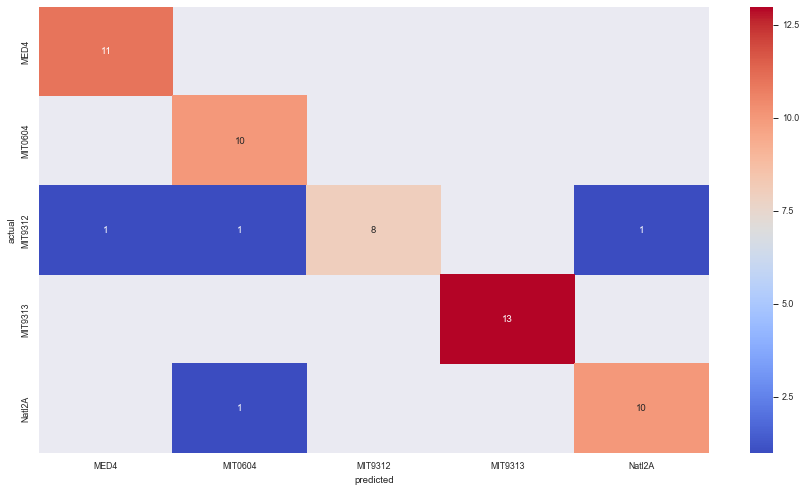

In [178]:
    from sklearn.metrics import classification_report, accuracy_score
    y_df = y34_df
    y_df['actual'] = y_df['PRO_FL_y']
    y_df['predicted'] = y_df['PRO_FL_y_pred']
    y_df = y_df.loc[y_df.Type == 'Test']
    t = y_df.pivot_table(index='actual', columns=['predicted'], 
                                                  values=['Type'], aggfunc='count')
    t.columns = t.columns.get_level_values(1)
    print(f"accuracy: {accuracy_score(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred'])}")
    print(classification_report(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred']))

    #forest_feature_importance(clf, X.columns)

    sns.heatmap(t, annot=True, cmap='coolwarm')


Text(0.5, 1, 'experiment 3&4: Important days for distinguishing between PRO strains \n(RandomForest, accuracy 93% on test), aligned to max day ')

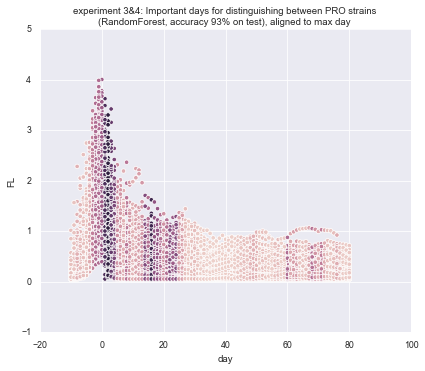

In [182]:
feature_importances34 = pd.DataFrame(clf34.feature_importances_,
                                   index = features34,
                                    columns=['importance'])
merge34df = ds34.merge(feature_importances34, left_on='day', right_index=True, how='left')
sns.relplot(data=merge34df, x='day', y='FL', hue='importance', legend=None, aspect=1.2)
plt.title('experiment 3&4: Important days for distinguishing between PRO strains \n(RandomForest, accuracy 93% on test), aligned to max day ')

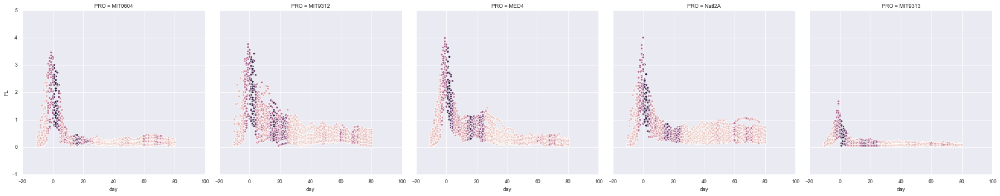

In [180]:
sns.relplot(data=merge34df, x='day', y='FL', hue='importance', legend=None, col='PRO', col_order=porder)

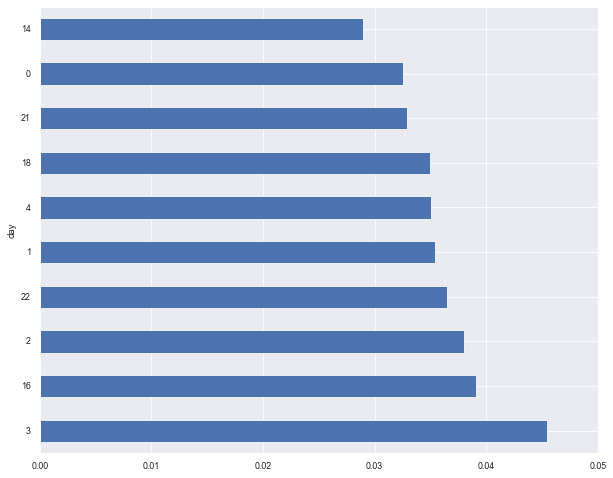

In [49]:
feature_importances34.nlargest(columns='importance',n=10).plot(kind='barh', legend=False,  figsize=(10,8) )

In [50]:
stats56_df.sort_values('f1_test', ascending=False).loc[:,['f1_test','accuracy_test', 'accuracy_train',  
       ]].head(10)

,f1_test,accuracy_test,accuracy_train
22,0.781620,0.784314,1.0
0,0.781470,0.784314,1.0
8,0.781281,0.784314,1.0
27,0.780841,0.784314,1.0
6,0.764995,0.764706,1.0
4,0.762792,0.764706,1.0
18,0.762526,0.764706,1.0
13,0.762526,0.764706,1.0
23,0.762526,0.764706,1.0
11,0.762186,0.764706,1.0


In [51]:
idx56 = 8
y56_df =  y56_list[idx56]
clf56 = clf56_list[idx56]
features56 = features56_list[idx56]

In [52]:
y56_df.head()

,PRO_FL_y,PRO_FL_y_PRO,PRO_FL_y_pred,PRO_FL_y_pred_PRO,Type
experiment_sample,,,,,
"e5, 10A, FL_0.05_0_first",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e5, 10A, FL_0.05_0_last",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e5, 10A, FL_0.05_0_max",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e5, 10A, FL_0.05_0_mean",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e5, 10A, FL_0.05_0_median",MIT0604,MIT0604,MIT0604,MIT0604,Train


accuracy: 0.7843137254901961
              precision    recall  f1-score   support

        MED4       0.75      0.82      0.78        11
     MIT0604       0.70      0.78      0.74         9
     MIT9312       0.80      0.67      0.73        12
     MIT9313       0.82      1.00      0.90         9
      Natl2A       0.88      0.70      0.78        10

    accuracy                           0.78        51
   macro avg       0.79      0.79      0.78        51
weighted avg       0.79      0.78      0.78        51



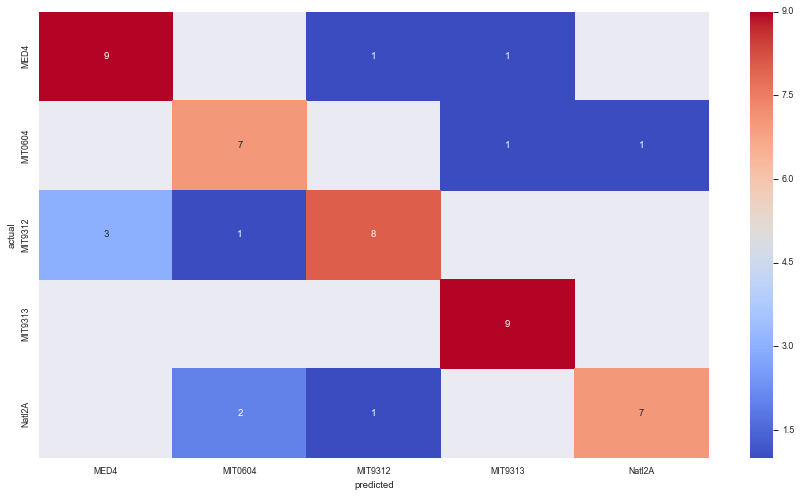

In [53]:
    from sklearn.metrics import classification_report, accuracy_score
    y_df = y56_df
    y_df['actual'] = y_df['PRO_FL_y']
    y_df['predicted'] = y_df['PRO_FL_y_pred']
    y_df = y_df.loc[y_df.Type == 'Test']
    t = y_df.pivot_table(index='actual', columns=['predicted'], 
                                                  values=['Type'], aggfunc='count')
    t.columns = t.columns.get_level_values(1)
    print(f"accuracy: {accuracy_score(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred'])}")
    print(classification_report(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred']))

    #forest_feature_importance(clf, X.columns)

    sns.heatmap(t, annot=True, cmap='coolwarm')


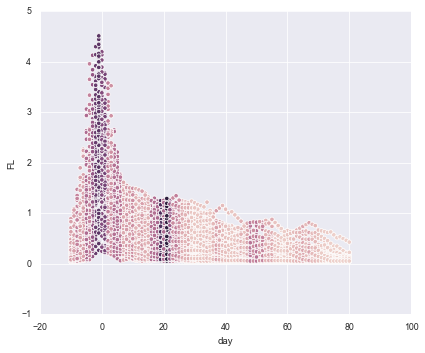

In [54]:
feature_importances56 = pd.DataFrame(clf56.feature_importances_,
                                   index = features56,
                                    columns=['importance'])
merge56df = ds56.merge(feature_importances56, left_on='day', right_index=True, how='left')
sns.relplot(data=merge56df, x='day', y='FL', hue='importance', legend=None, aspect=1.2)

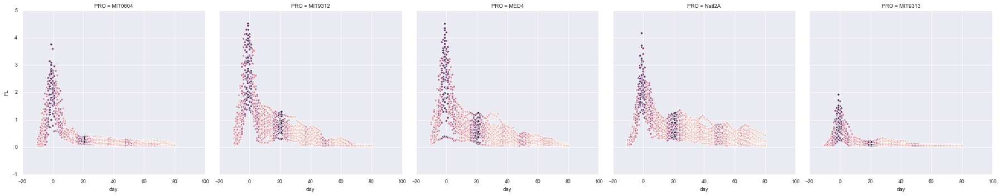

In [55]:
sns.relplot(data=merge56df, x='day', y='FL', hue='importance', legend=None, col='PRO', col_order=porder)

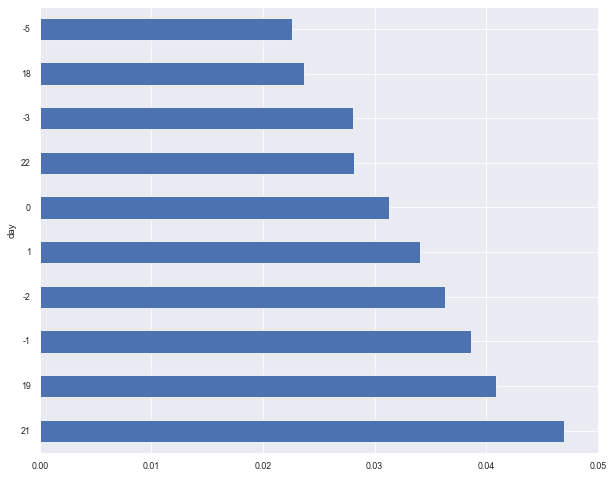

In [56]:
feature_importances56.nlargest(columns='importance',n=10).plot(kind='barh', legend=False,  figsize=(10,8) )

In [57]:
stats1_df.sort_values('f1_test', ascending=False).loc[:,['f1_test','accuracy_test', 'accuracy_train',  
       ]].head(10)

,f1_test,accuracy_test,accuracy_train
26,0.965517,0.965517,1.0
28,0.965517,0.965517,1.0
3,0.965517,0.965517,1.0
21,0.965517,0.965517,1.0
5,0.965517,0.965517,1.0
7,0.965517,0.965517,1.0
19,0.965517,0.965517,1.0
18,0.965517,0.965517,1.0
17,0.965517,0.965517,1.0
24,0.931383,0.931034,1.0


In [58]:
idx1 = 26
y1_df =  y1_list[idx1]
clf1 = clf1_list[idx1]
features1 = features1_list[idx1]

In [59]:
y1_df.head()

,PRO_FL_y,PRO_FL_y_PRO,PRO_FL_y_pred,PRO_FL_y_pred_PRO,Type
experiment_sample,,,,,
"e1, 10B, FL_0.05_0_first",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e1, 10B, FL_0.05_0_last",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e1, 10B, FL_0.05_0_max",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e1, 10B, FL_0.05_0_mean",MIT0604,MIT0604,MIT0604,MIT0604,Train
"e1, 10B, FL_0.05_0_median",MIT0604,MIT0604,MIT0604,MIT0604,Train


accuracy: 0.9655172413793104
              precision    recall  f1-score   support

        MED4       1.00      1.00      1.00         7
     MIT0604       0.80      1.00      0.89         4
     MIT9312       1.00      0.80      0.89         5
     MIT9313       1.00      1.00      1.00         7
      Natl2A       1.00      1.00      1.00         6

    accuracy                           0.97        29
   macro avg       0.96      0.96      0.96        29
weighted avg       0.97      0.97      0.97        29



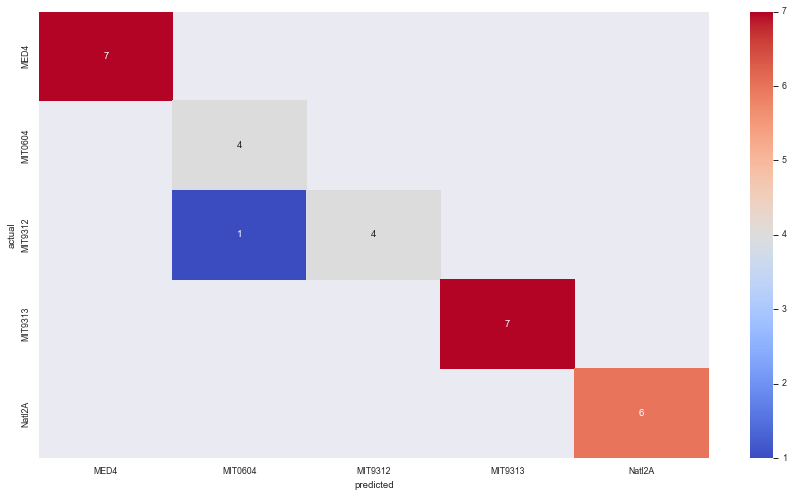

In [60]:
    from sklearn.metrics import classification_report, accuracy_score
    y_df = y1_df
    y_df['actual'] = y_df['PRO_FL_y']
    y_df['predicted'] = y_df['PRO_FL_y_pred']
    y_df = y_df.loc[y_df.Type == 'Test']
    t = y_df.pivot_table(index='actual', columns=['predicted'], 
                                                  values=['Type'], aggfunc='count')
    t.columns = t.columns.get_level_values(1)
    print(f"accuracy: {accuracy_score(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred'])}")
    print(classification_report(y_true=y_df['PRO_FL_y'], y_pred=y_df['PRO_FL_y_pred']))

    #forest_feature_importance(clf, X.columns)

    sns.heatmap(t, annot=True, cmap='coolwarm')


Text(0.5, 1, 'Important days for distinguishing between PRO strains (RandomForest, accuracy 96% on test), aligned to max day ')

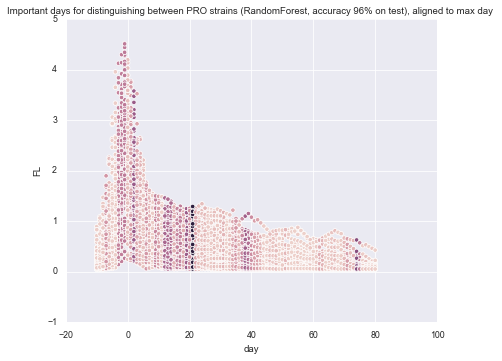

In [64]:
feature_importances1 = pd.DataFrame(clf1.feature_importances_,
                                   index = features1,
                                    columns=['importance'])
merge1df = ds56.merge(feature_importances1, left_on='day', right_index=True, how='left')
sns.relplot(data=merge1df, x='day', y='FL', hue='importance', legend=None, aspect=1.2)
plt.title('Important days for distinguishing between PRO strains (RandomForest, accuracy 96% on test), aligned to max day ')

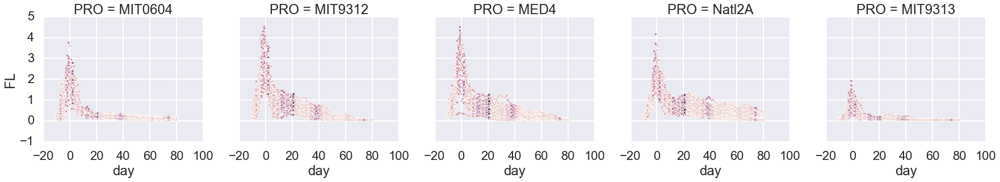

In [73]:
sns.set_context('poster')
sns.relplot(data=merge1df, x='day', y='FL', hue='importance', legend=None, col='PRO', col_order=porder)
#plt.suptitle('Important days for distinguishing between PRO strains (RandomForest, accuracy 96% on test), aligned to max day')

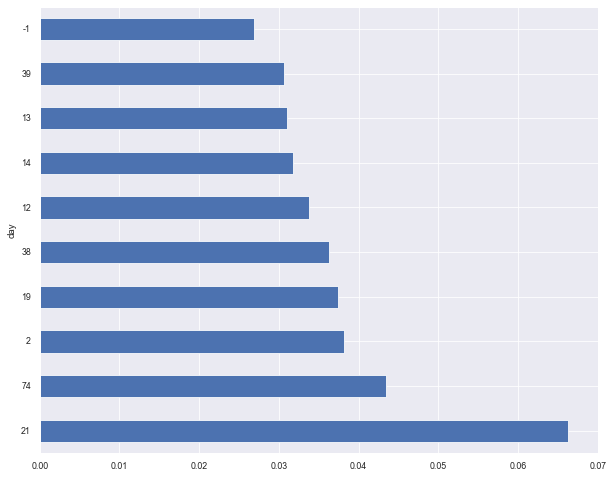

In [63]:
feature_importances1.nlargest(columns='importance',n=10).plot(kind='barh', legend=False,  figsize=(10,8) )

In [107]:
feature_importances_all34 = pd.DataFrame({
    'day': [v for l in features34_list for v in l],
    'importance' :  [v for l in clf34_list for v in l.feature_importances_ ]
})
feature_importances_all56 = pd.DataFrame({
    'day': [v for l in features56_list for v in l],
    'importance' :  [v for l in clf56_list for v in l.feature_importances_ ]
})
feature_importances_all1 = pd.DataFrame({
    'day': [v for l in features1_list for v in l],
    'importance' :  [v for l in clf1_list for v in l.feature_importances_ ]
})



In [108]:
feature_importances_all34.index

RangeIndex(start=0, stop=2730, step=1)

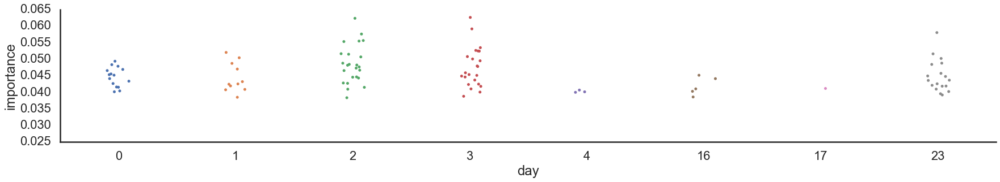

In [111]:
sns.catplot(data=feature_importances_all34.nlargest(columns='importance', n=100), x='day', y='importance',  aspect=5)

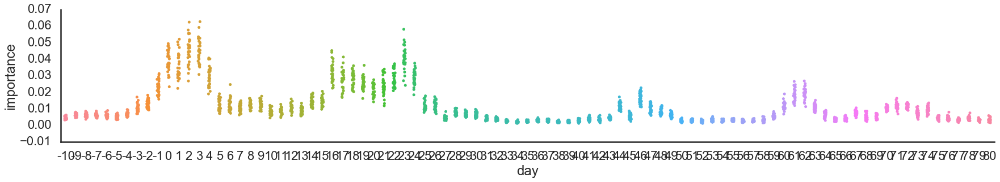

In [112]:
sns.catplot(data=feature_importances_all34, x='day', y='importance',  aspect=5)

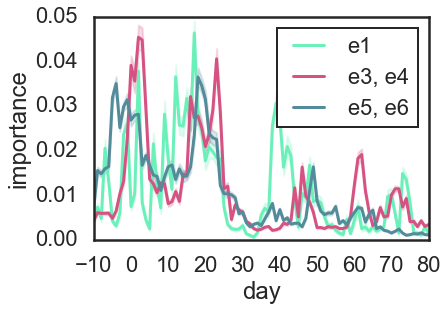

In [228]:
sns.lineplot(data=feature_importances_all1, x='day', y='importance', color=espallete[0],   label='e1', )
sns.lineplot(data=feature_importances_all34, x='day', y='importance', color=espallete[1], label='e3, e4')
sns.lineplot(data=feature_importances_all56, x='day', y='importance', color=espallete[2],  label='e5, e6')


# cluster by decline

## PCA 5 experiments

In [117]:
value_col = 'FL'

In [118]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(ds, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(ds)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.72765281 0.11741346]


In [119]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

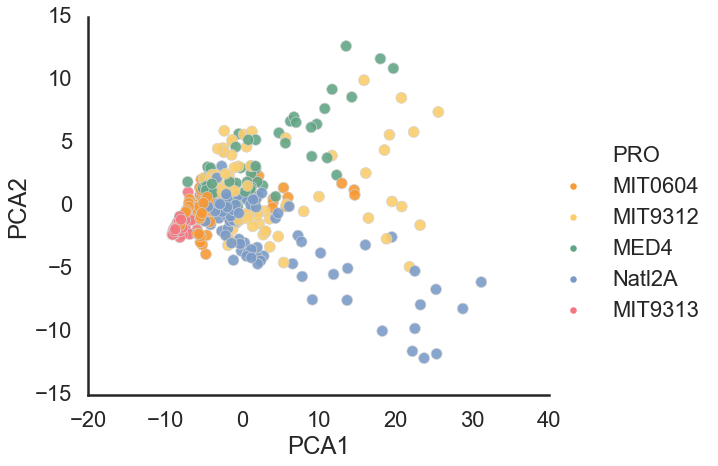

In [120]:
sns.set_style('white')

sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

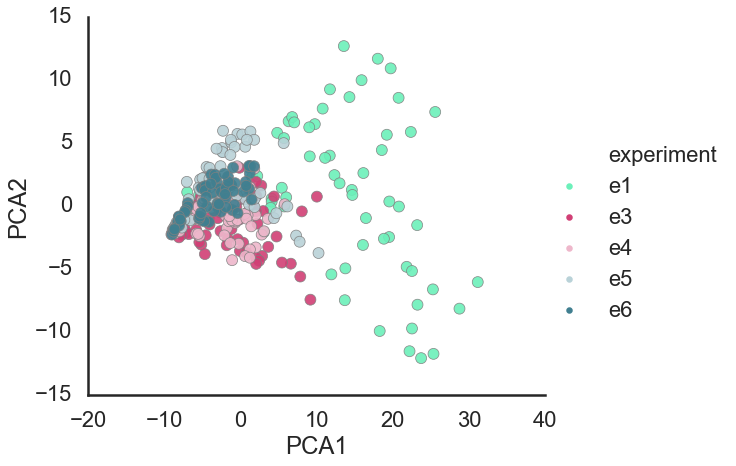

In [121]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

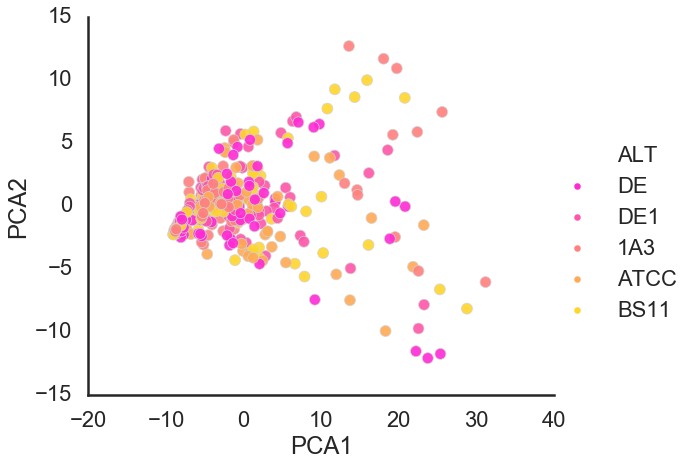

In [122]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

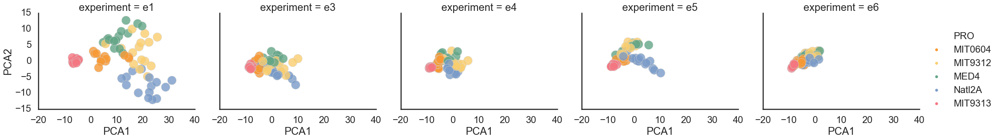

In [123]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

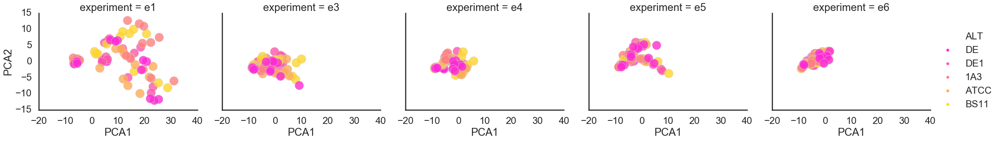

In [124]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

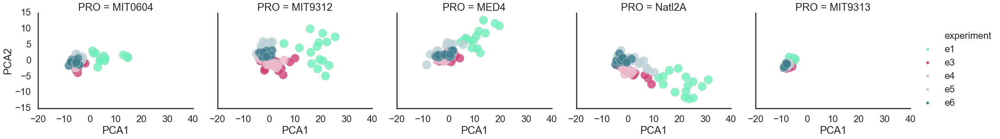

In [125]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

In [214]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
X = cp.experiments2X(ds, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(ds)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

In [215]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

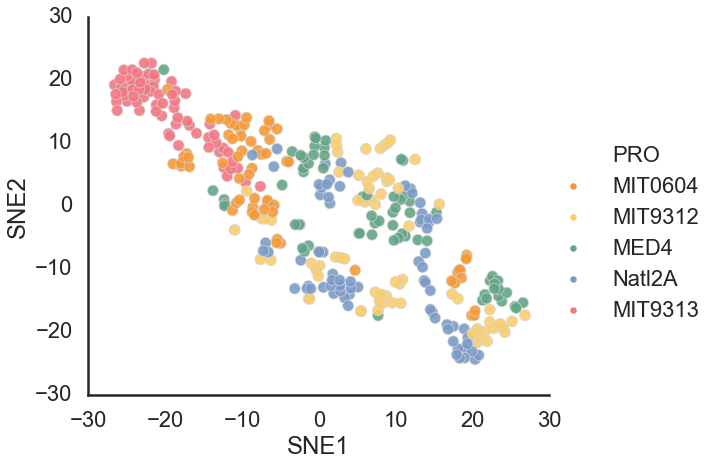

In [216]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

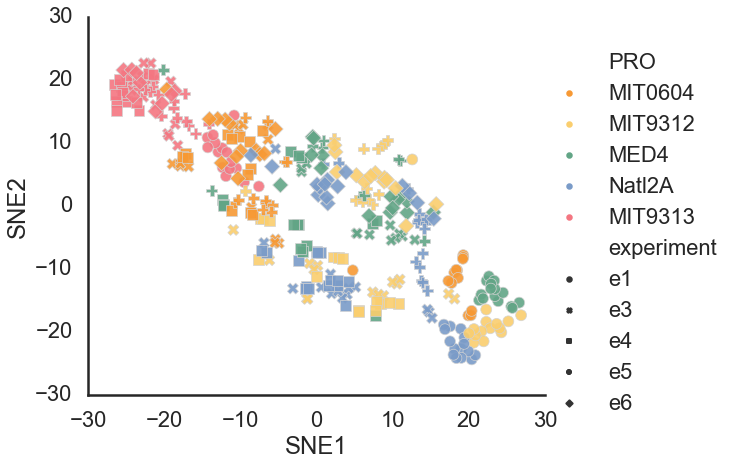

In [226]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            #style='ALT',
            style='experiment',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

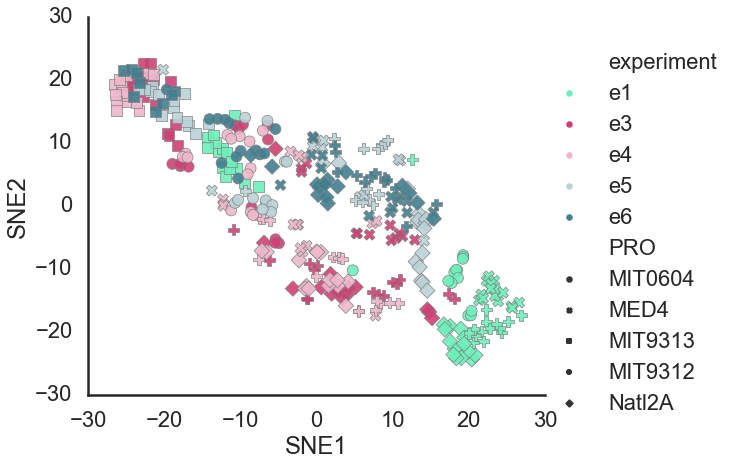

In [225]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='experiment', 
            style='PRO',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

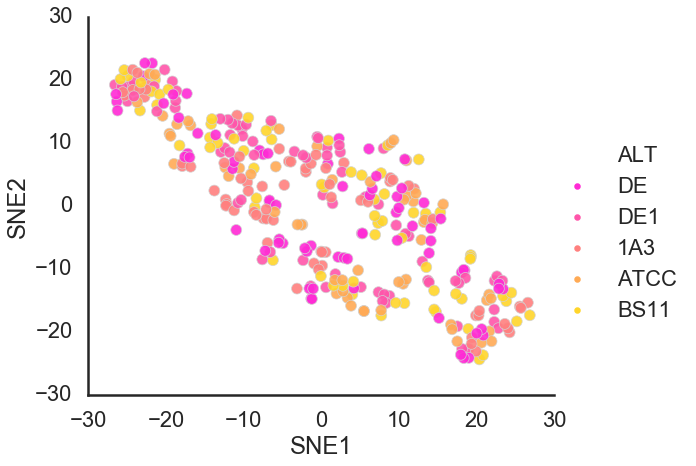

In [219]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

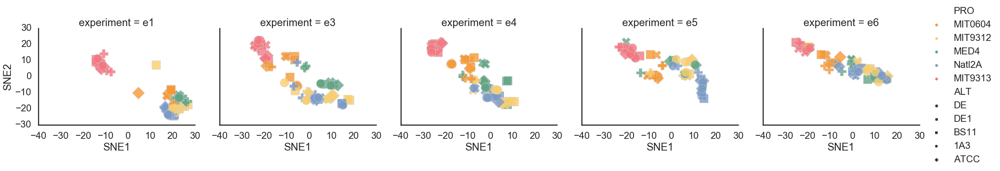

In [224]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', col='experiment',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

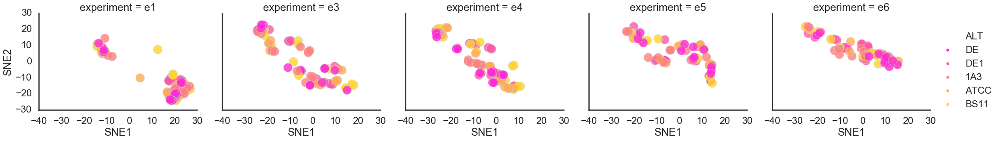

In [221]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

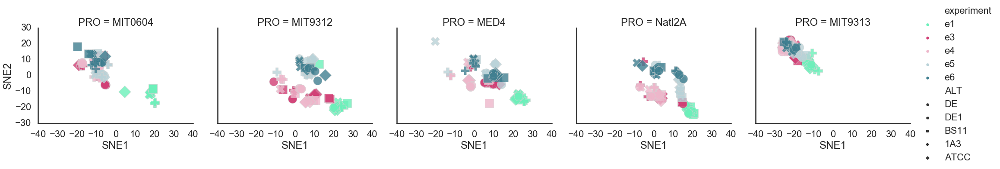

In [223]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='experiment',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

## PCA 4 experiments

In [156]:
value_col = 'FL'

In [157]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
pcain_df = ds.loc[ds.experiment.isin(['e3', 'e4', 'e5', 'e6'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.56457792 0.1723785 ]


In [158]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

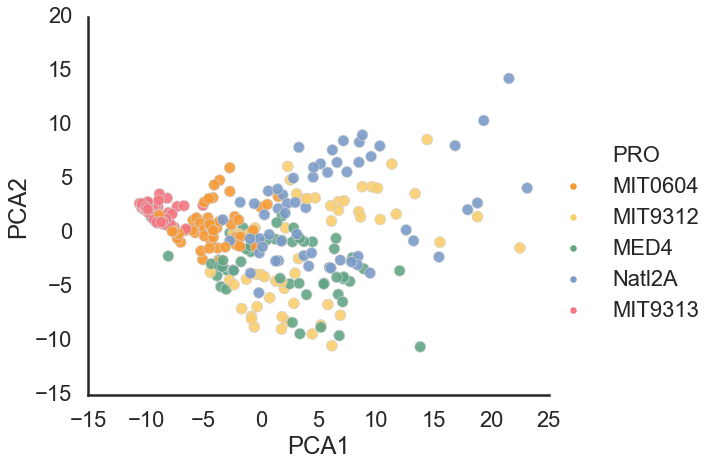

In [159]:
sns.set_style('white')

sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

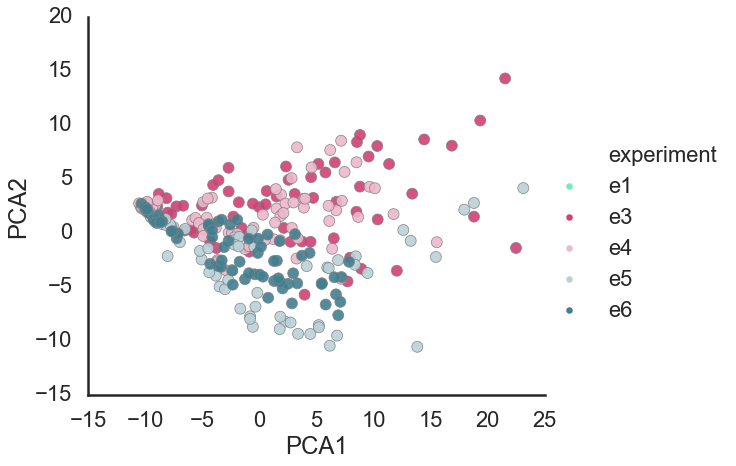

In [160]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

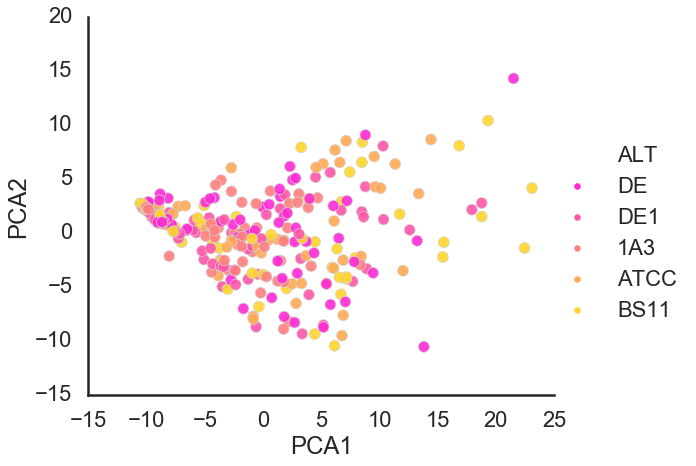

In [161]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

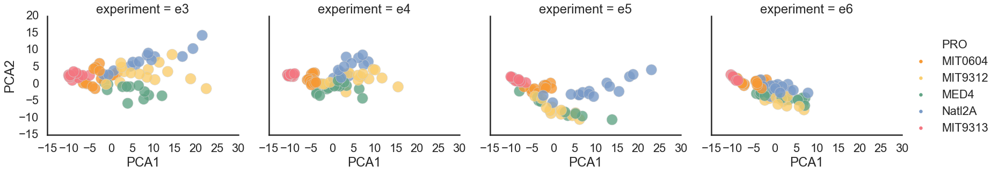

In [162]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

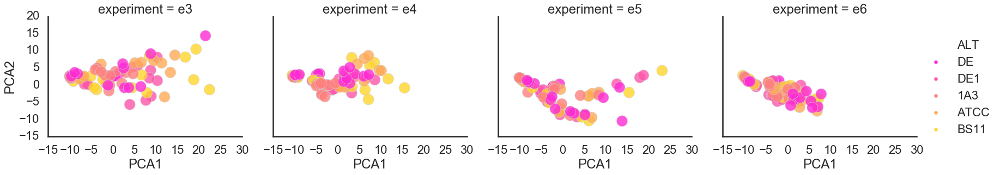

In [163]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

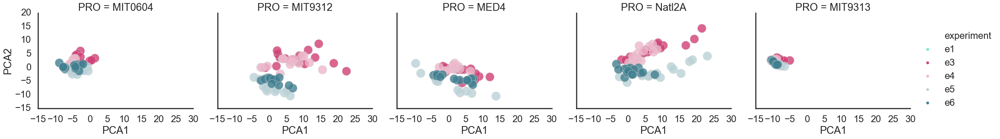

In [164]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

In [165]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
pcain_df = ds.loc[ds.experiment.isin(['e3', 'e4', 'e5', 'e6'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

In [166]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

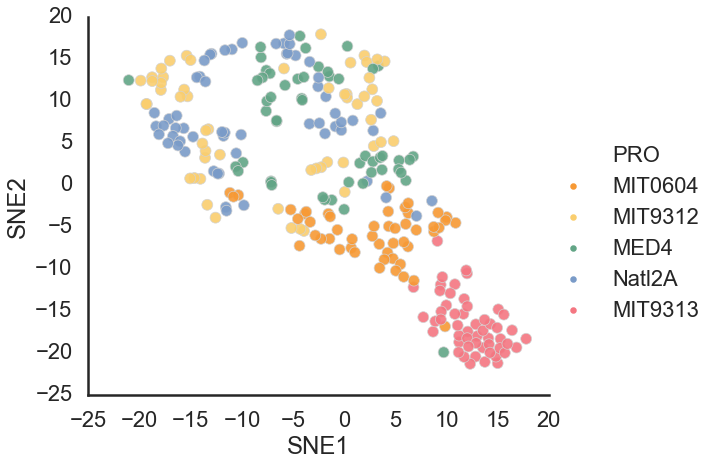

In [167]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

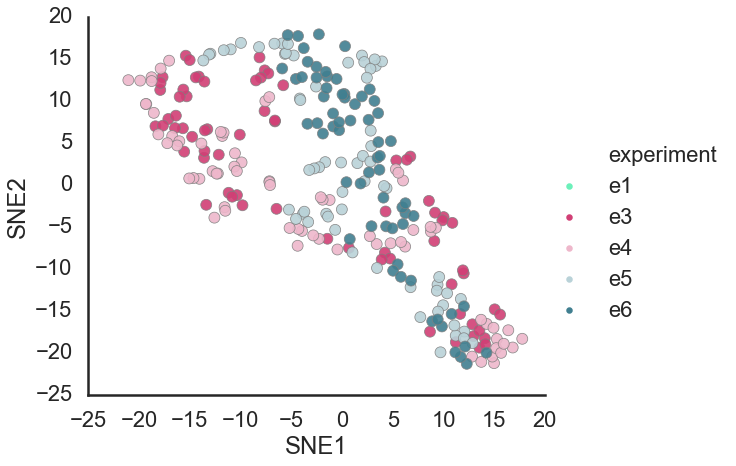

In [168]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

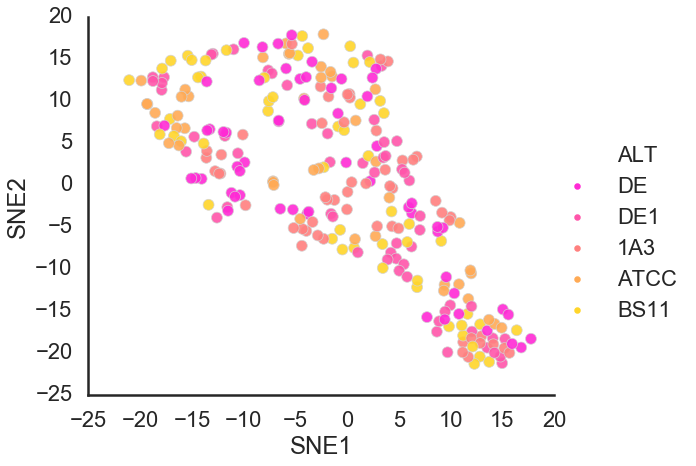

In [169]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

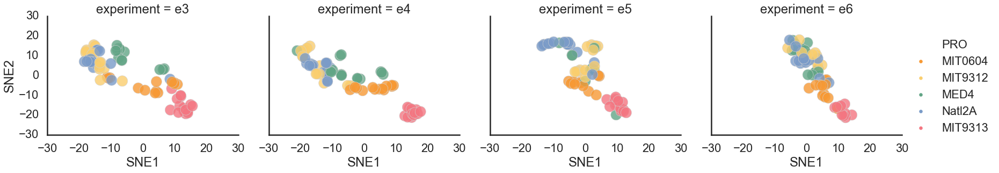

In [170]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

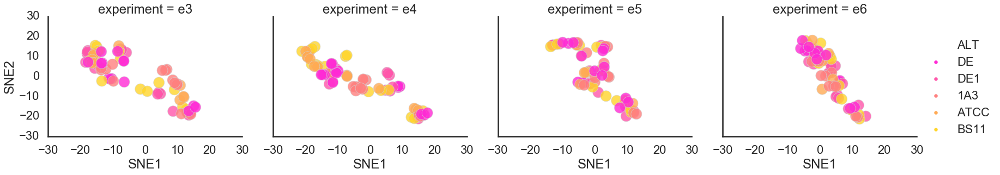

In [171]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

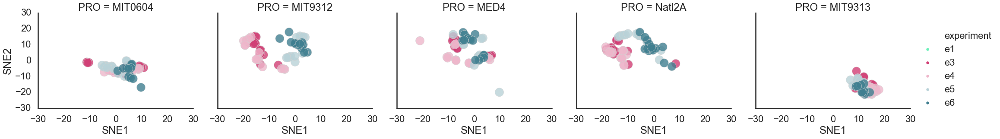

In [172]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

## PCA 3,4 experiments

In [173]:
value_col = 'FL'

In [174]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
pcain_df = ds.loc[ds.experiment.isin(['e3', 'e4'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.62707758 0.1001848 ]


In [175]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

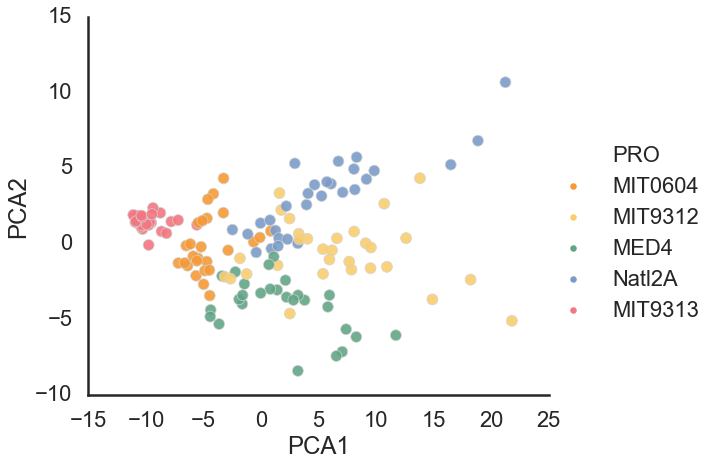

In [176]:
sns.set_style('white')

sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

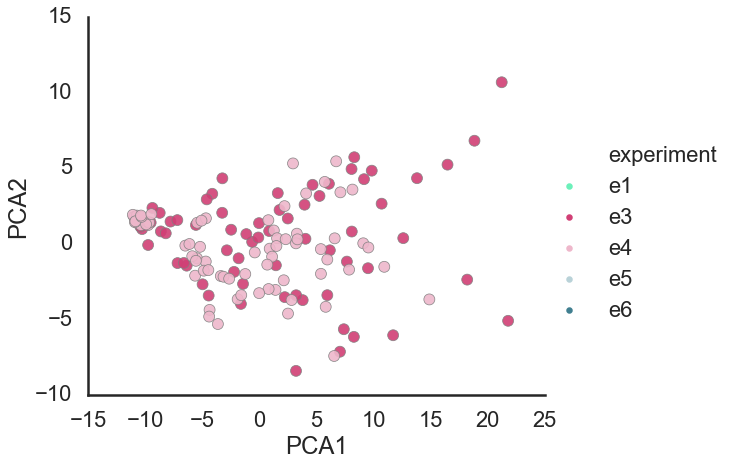

In [177]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

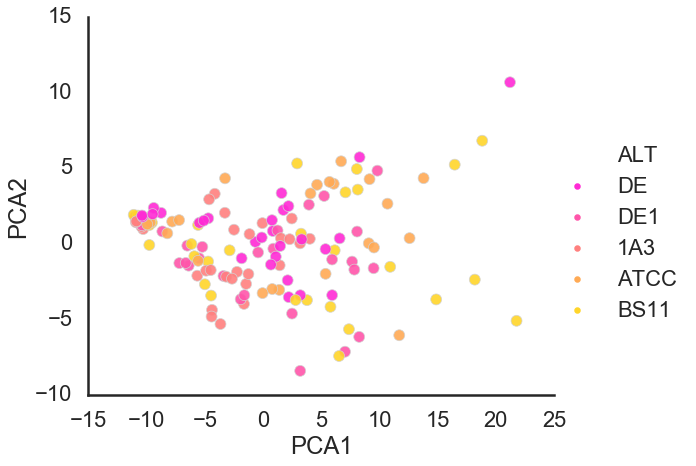

In [178]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

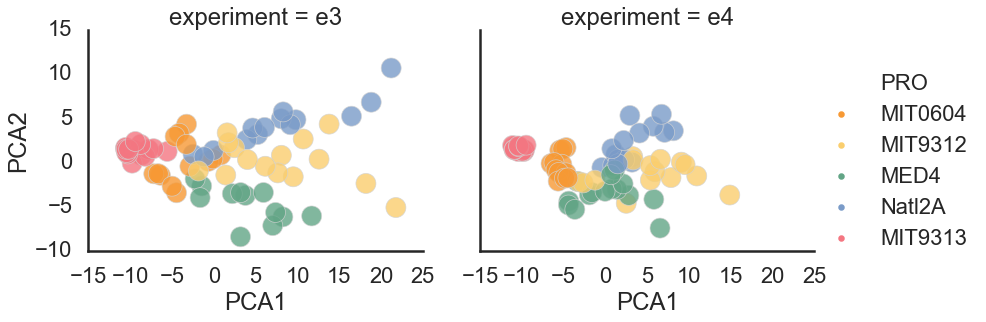

In [179]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

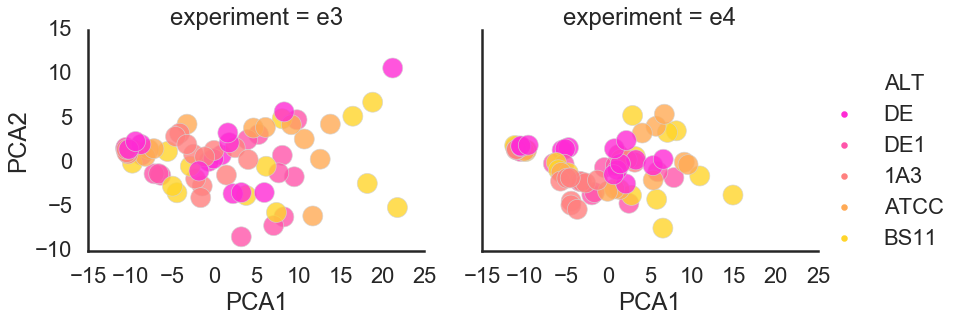

In [180]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

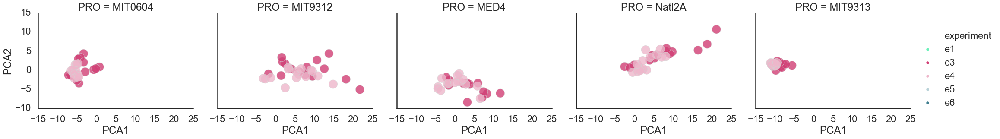

In [181]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

In [182]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
pcain_df = ds.loc[ds.experiment.isin(['e3', 'e4'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

In [183]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

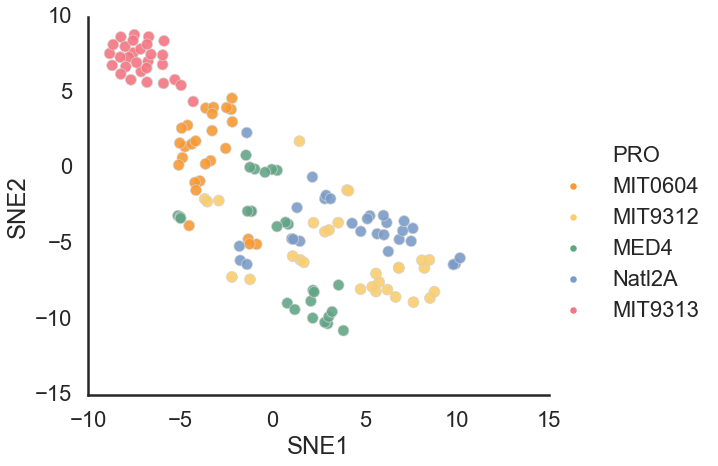

In [184]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

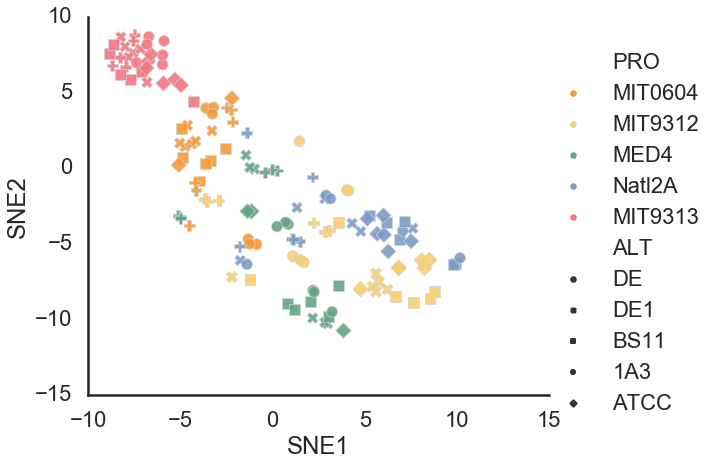

In [190]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            style='ALT',
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

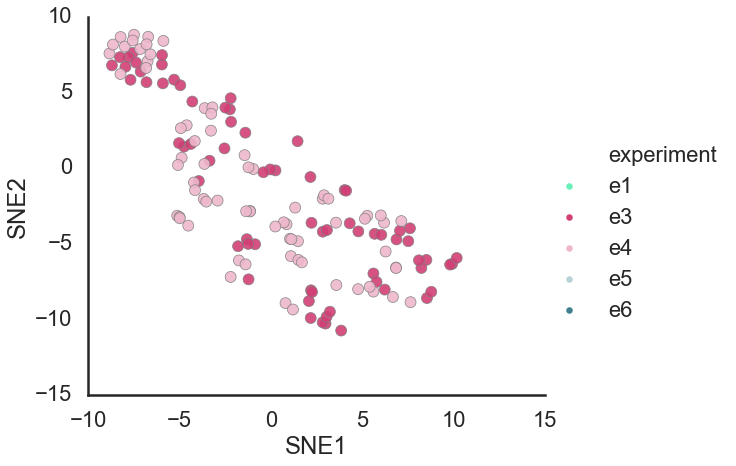

In [185]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

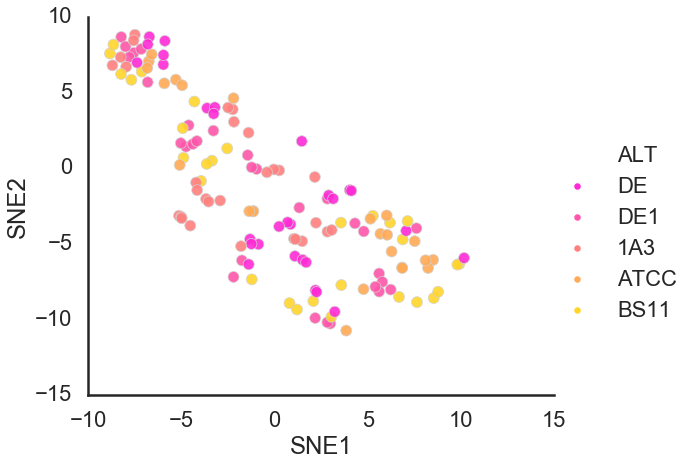

In [186]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

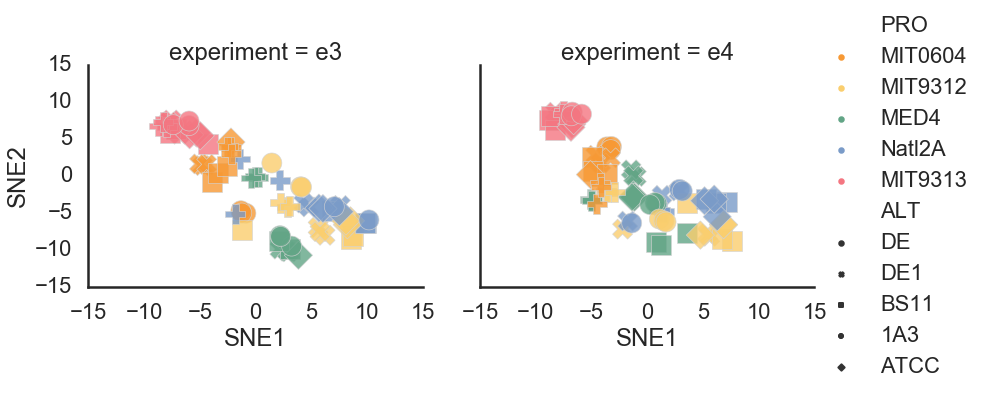

In [194]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', col='experiment',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

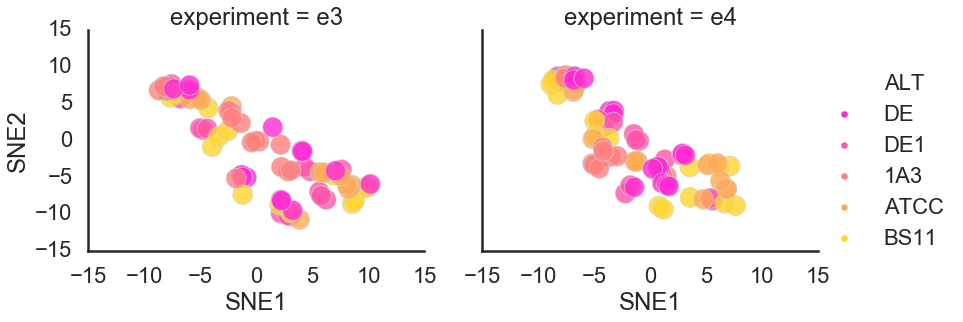

In [188]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

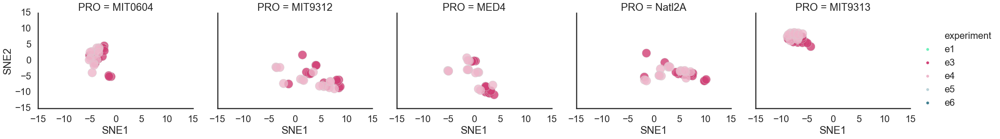

In [189]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

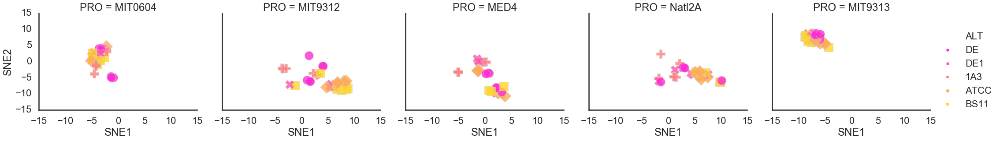

In [193]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='ALT',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

# PCA 1 experiments

In [195]:
value_col = 'FL'

In [196]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
#dfe_resample3 = cp.resample_df(dfe, value_col=value_col, period='5d')
pcain_df = ds.loc[ds.experiment.isin(['e1'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.66265771 0.17907911]


In [197]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

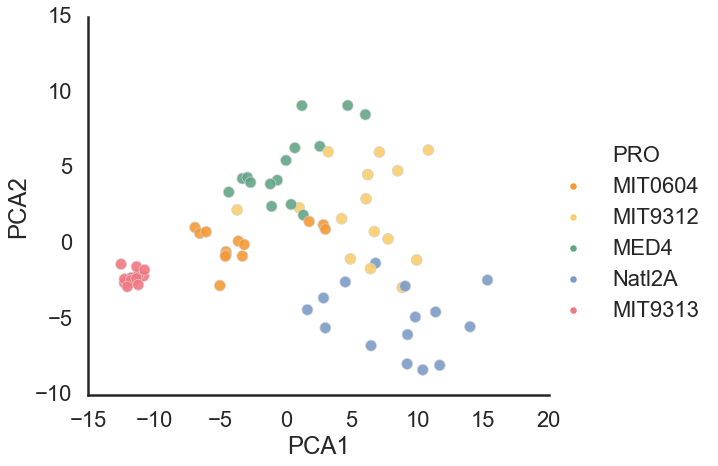

In [198]:
sns.set_style('white')

sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

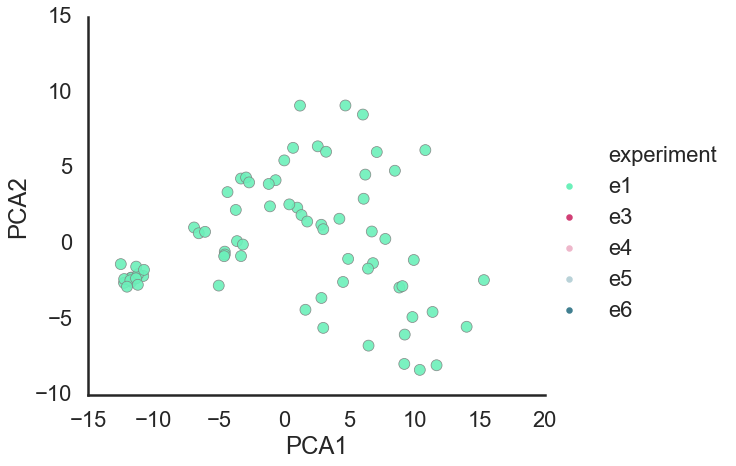

In [199]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

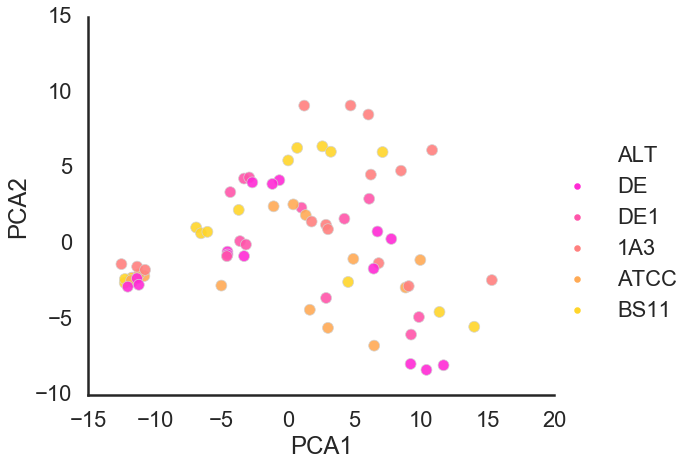

In [200]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

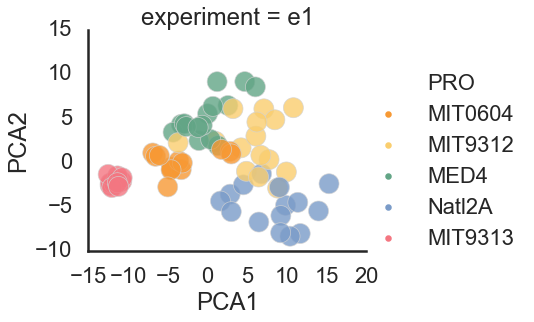

In [201]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

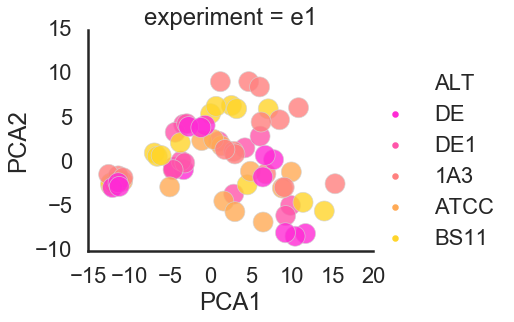

In [202]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

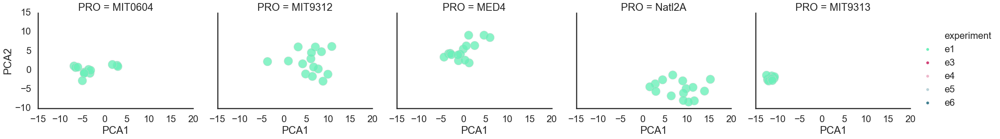

In [203]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

In [204]:
#dfe['sample_experiment'] = dfe['sample']+ ','+ dfe['experiment']
#sample_col = 'sample_experiment'
sample_col = 'experiment_sample'
pcain_df = ds.loc[ds.experiment.isin(['e1'])]
X = cp.experiments2X(pcain_df, value_col=value_col, cumsummode=False)
metadf = cp.get_meta(pcain_df)
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

In [205]:
# Hl - MED4 , MIT9312, MIT0604
# LLIV MIT9313
# LLI Natl2A

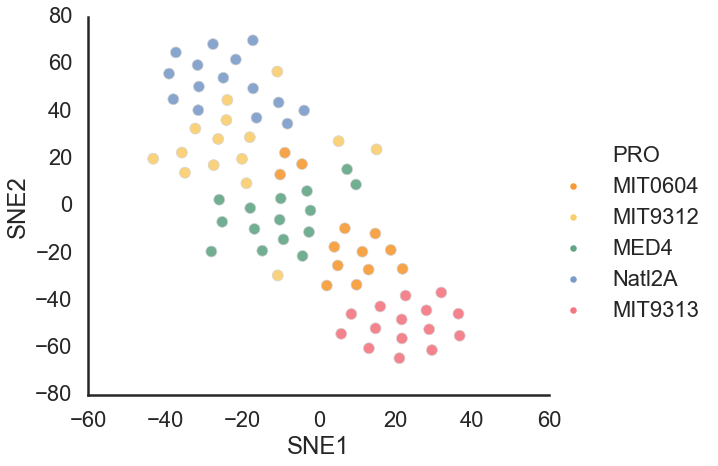

In [206]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

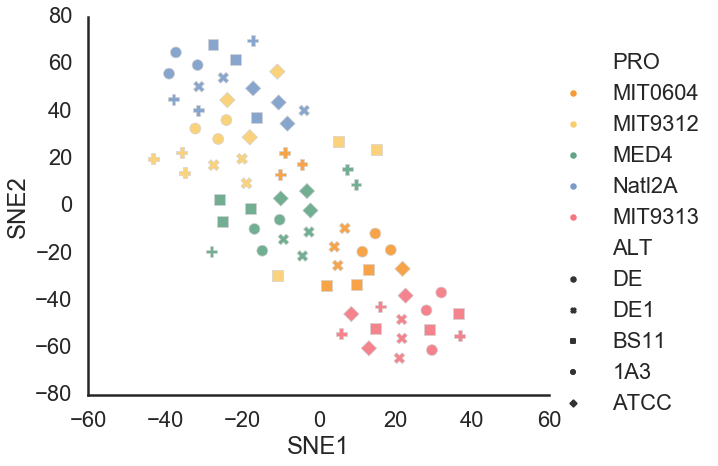

In [207]:
sns.set_style('white')

sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', 
            style='ALT',
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

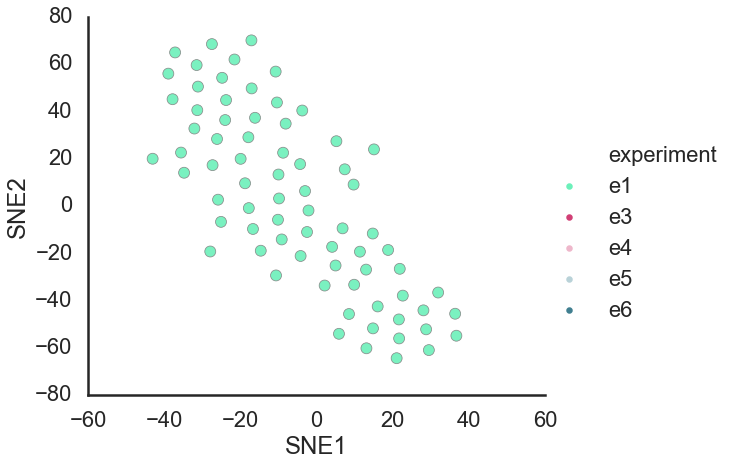

In [208]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='experiment', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=epallete, hue_order=eorder ,edgecolor='grey',
           )

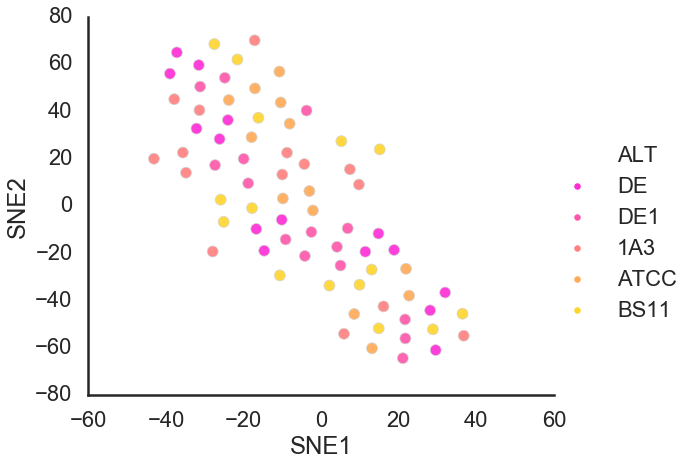

In [209]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', 
            #style='ALT',
            s=120, alpha=0.9, height=7, aspect=1.2,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

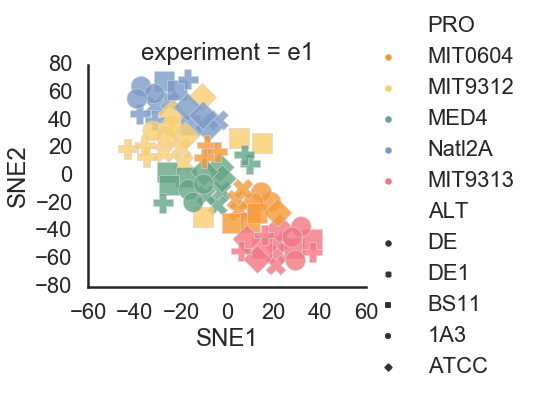

In [210]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='PRO', col='experiment',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=ppallete, hue_order=porder ,edgecolor='lightgrey',
           )

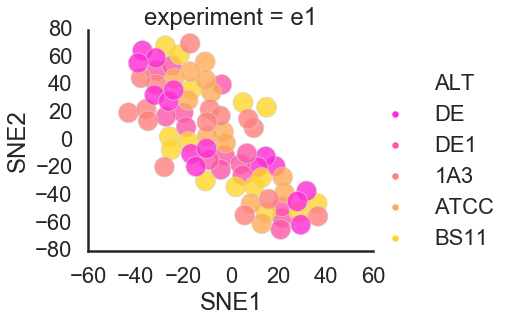

In [211]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='ALT', col='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            #col_order=
            palette=apallete, hue_order=aorder ,edgecolor='lightgrey',
           )

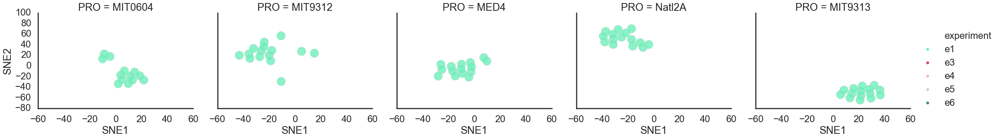

In [212]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='experiment',
            #style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=epallete, hue_order=eorder, edgecolor='lightgrey',
           )

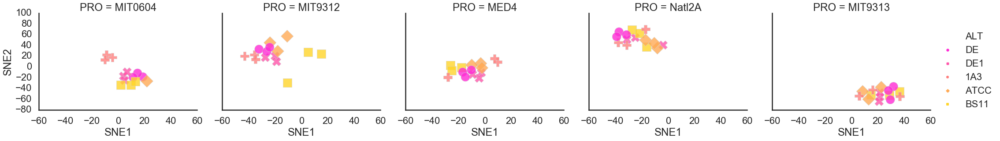

In [213]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', col='PRO', hue='ALT',
            style='ALT',
            s=400, alpha=0.8, height=5, aspect=1.2,
            col_order=porder,
            palette=apallete, hue_order=aorder, edgecolor='lightgrey',
           )

# Heatmaps

In [126]:
#metadf = cp.get_meta(df, meta_col=['experiment_sample', 'Mode','Sample', 'PRO', 'ALT'])
#metadf = metadf.loc[metadf.experiment_sample.isin(X1.index)]
metadf.index = metadf[sample_col]
col = 'PRO'
lut = dict(zip(metadf[col].unique(), sns.color_palette('Set2', n_colors=metadf[col].nunique())))
lut = dict(zip(porder, sns.color_palette(ppallete, n_colors=metadf[col].nunique())))
row_colors = metadf[col].map(lut)

col2 = 'experiment'
lut2 = dict(zip(metadf[col2].unique(), sns.color_palette('Set3', n_colors=metadf[col2].nunique())))
lut2 = dict(zip(eorder, sns.color_palette(epallete, n_colors=metadf[col2].nunique())))
row_colors2 = metadf[col2].map(lut2)

col3 = 'ALT'
lut3 = dict(zip(aorder, sns.color_palette(apallete, n_colors=metadf[col3].nunique())))
row_colors3 = metadf[col3].map(lut3)

#dfe_resample3 = cp.resample_df(dfe, value_col='decline', period='3d')
#X = cp.experiments2X(dfe_resample3, value_col='decline', cumsummode=False)


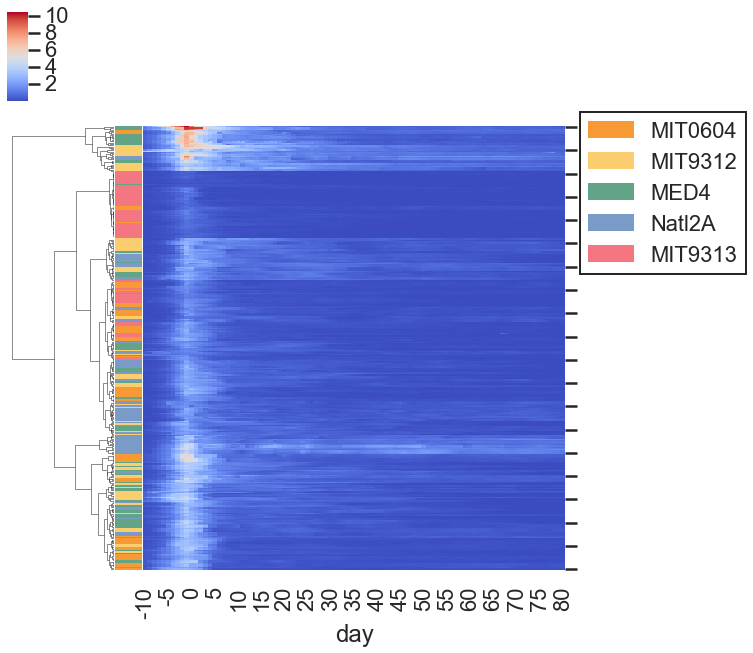

In [127]:
import matplotlib.patches as mpatches
g = sns.clustermap(data=X, col_cluster=False, #row_cluster=False,
                   cmap="coolwarm", 
                   row_colors=[row_colors, 
                       #row_colors2
                              ], 
               method='ward'
                  )
g.ax_heatmap.set_yticklabels('')
g.ax_heatmap.set_ylabel('')
legend_TN =  [mpatches.Patch(color=c, label=l) for l,c in lut.items()]
#legend_TN.extend([mpatches.Patch(color=c, label=l) for l,c in lut2.items()])

l2=g.ax_heatmap.legend(loc='center left',bbox_to_anchor=(1.01,0.85),handles=legend_TN,frameon=True)

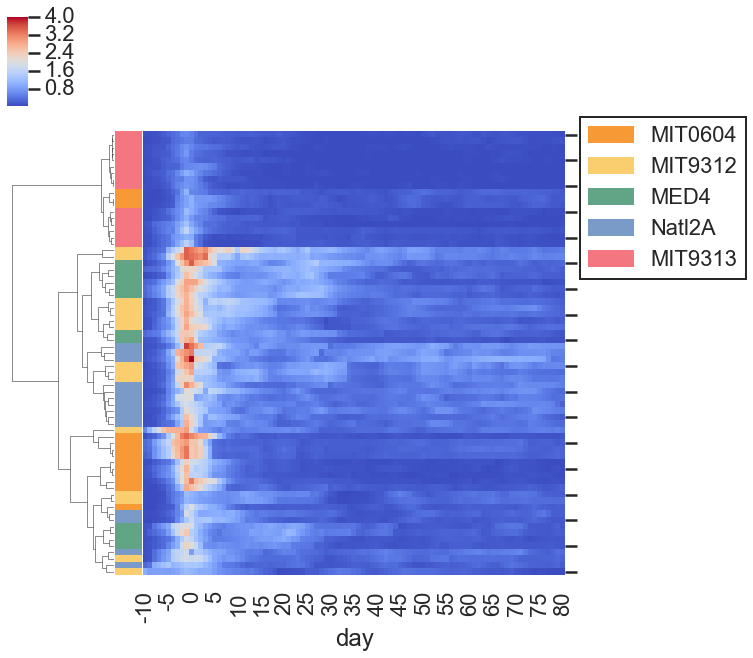

In [60]:
import matplotlib.patches as mpatches
X = cp.experiments2X(ds.loc[ds.experiment == 'e3'], value_col=value_col, cumsummode=False)
metadf = cp.get_meta(ds.loc[ds.experiment == 'e3'])
metadf['sample_experiment'] = metadf['sample']+ ','+ metadf['experiment']

g = sns.clustermap(data=X, col_cluster=False, #row_cluster=False,
                   cmap="coolwarm", 
                   row_colors=[row_colors, 
                      # row_colors3
                              ], 
               method='ward'
                  )
g.ax_heatmap.set_yticklabels('')
g.ax_heatmap.set_ylabel('')
legend_TN =  [mpatches.Patch(color=c, label=l) for l,c in lut.items()]
#legend_TN.extend([mpatches.Patch(color=c, label=l) for l,c in lut3.items()])

l2=g.ax_heatmap.legend(loc='center left',bbox_to_anchor=(1.01,0.85),handles=legend_TN,frameon=True)

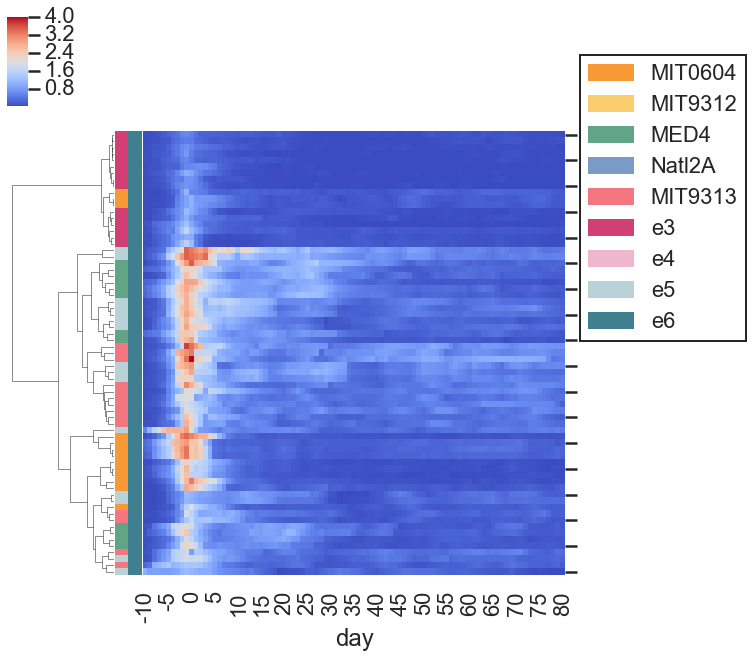

In [61]:
import matplotlib.patches as mpatches
g = sns.clustermap(data=X, col_cluster=False, #row_cluster=False,
                   cmap="coolwarm", 
                   row_colors=[row_colors, 
                       row_colors2
                              ], 
               method='ward'
                  )
g.ax_heatmap.set_yticklabels('')
g.ax_heatmap.set_ylabel('')
legend_TN =  [mpatches.Patch(color=c, label=l) for l,c in lut.items()]
legend_TN.extend([mpatches.Patch(color=c, label=l) for l,c in lut2.items()])

l2=g.ax_heatmap.legend(loc='center left',bbox_to_anchor=(1.01,0.85),handles=legend_TN,frameon=True)

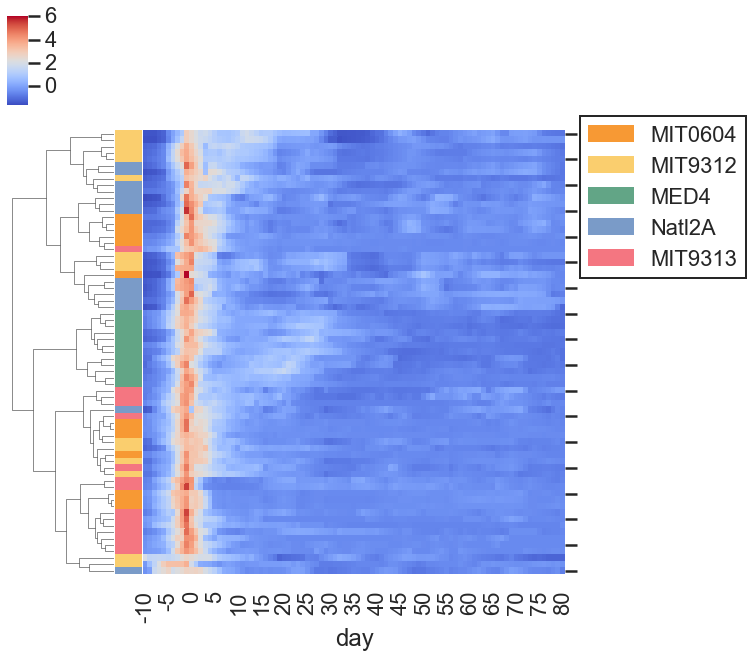

In [62]:
import matplotlib.patches as mpatches
g = sns.clustermap(data=X, col_cluster=False, #row_cluster=False,
                   cmap="coolwarm", 
                   row_colors=[row_colors, 
                       #row_colors2
                              ], 
               method='ward',
                   z_score=0, 
                  )
g.ax_heatmap.set_yticklabels('')
g.ax_heatmap.set_ylabel('')
legend_TN =  [mpatches.Patch(color=c, label=l) for l,c in lut.items()]
#legend_TN.extend([mpatches.Patch(color=c, label=l) for l,c in lut2.items()])

l2=g.ax_heatmap.legend(loc='center left',bbox_to_anchor=(1.01,0.85),handles=legend_TN,frameon=True)

# Analyze Features

In [57]:
from sklearn.linear_model import LogisticRegression


In [58]:
import tsfresh
from tsfresh.utilities.dataframe_functions import impute


In [59]:
def compute_corr(x, y):
    x = x.values.reshape(-1, 1)
    clf = LogisticRegression(solver='lbfgs', multi_class='multinomial').fit(x, y)
    return clf.score(x,y)

In [ ]:
ds34c = cp.update_calculated_fields(ds34, group_col='experiment_sample', add_experiment_sample=False)
ds56c = cp.update_calculated_fields(ds56, group_col='experiment_sample', add_experiment_sample=False)

df_features34 = cp.generate_features(ds34c)
df_features56 = cp.generate_features(ds56c)

In [ ]:
X_features34 = cp.features2X(df_features34)
metadf_features34 = cp.get_meta(df_features34, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
metadf_features34.index = metadf_features34.experiment_sample
y34 = metadf_features34['PRO']

In [ ]:
X_features56 = cp.features2X(df_features56)
metadf_features56 = cp.get_meta(df_features56, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
metadf_features56.index = metadf_features56.experiment_sample
y56 = metadf_features56['PRO']

In [ ]:
ts_f_features_df34 = tsfresh.extract_features(
    ds34c.loc[:, ['experiment_sample', 'FL', 'logFL', 'cumsumFL', 'cumsumlogFL', 'rateFL', 'ratelogFL', 'day']].fillna(0),
     column_id='experiment_sample', column_kind=None, 
     column_sort='day', 
    )


In [ ]:
ts_f_features_df56 = tsfresh.extract_features(
    ds56c.loc[:, ['experiment_sample', 'FL', 'logFL', 'cumsumFL', 'cumsumlogFL', 'rateFL', 'ratelogFL', 'day']].fillna(0),
     column_id='experiment_sample', column_kind=None, 
     column_sort='day', 
    )


In [ ]:
ts_f_features_df34 = impute(ts_f_features_df34)
ts_f_features_df56 = impute(ts_f_features_df56)

In [ ]:
scores34 = {c : compute_corr(X_features34[c], y34) for c in X_features34.columns }
scores56 = {c : compute_corr(X_features56[c], y56) for c in X_features34.columns }

In [ ]:
scores34.update({f'ts_{c}' : compute_corr(ts_f_features_df34[c], y34) for c in ts_f_features_df34.columns })
scores56.update({f'ts_{c}' : compute_corr(ts_f_features_df56[c], y56) for c in ts_f_features_df56.columns })


In [ ]:
scores34_df = pd.Series(scores34)
scores56_df = pd.Series(scores56)

In [ ]:
scores34_df.nlargest(20)

In [ ]:
scores56_df.nlargest(20)

In [ ]:
metadf

In [ ]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s != 3
    return ['background-color: yellow' if v else '' for v in is_max]

metadf.pivot_table(index=['PRO','ALT'], columns=['experiment'], aggfunc='count', values='sample').style.apply(highlight_max)

In [ ]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = len(s) != 3
    return ['background-color: yellow' if v else '' for v in is_max]

metadf.pivot_table(index=['PRO','ALT'], columns=['experiment'], aggfunc='nunique', 
                   values='sample')# .style.apply(highlight_max)